# RuLE Decoding
This notebook checks the function that decodes the run lenght encoding of images.

In [2]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import scipy.misc

In [3]:
# Load the csv which has all the RuLEs.
original_data = pd.read_csv("train_ship_segmentations_v2.csv")
original_data.head()

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


In [4]:
sample_rle = original_data['EncodedPixels'][2]
sample_rle

'264661 17 265429 33 266197 33 266965 33 267733 33 268501 33 269269 33 270037 33 270805 33 271573 33 272341 33 273109 33 273877 33 274645 33 275413 33 276181 33 276949 33 277716 34 278484 34 279252 33 280020 33 280788 33 281556 33 282324 33 283092 33 283860 33 284628 33 285396 33 286164 33 286932 33 287700 33 288468 33 289236 33 290004 33 290772 33 291540 33 292308 33 293076 33 293844 33 294612 33 295380 33 296148 33 296916 33 297684 33 298452 33 299220 33 299988 33 300756 33 301524 33 302292 33 303060 33 303827 34 304595 34 305363 33 306131 33 306899 33 307667 33 308435 33 309203 33 309971 33 310739 33 311507 33 312275 33 313043 33 313811 33 314579 33 315347 33 316115 33 316883 33 317651 33 318419 33 319187 33 319955 33 320723 33 321491 33 322259 33 323027 33 323795 33 324563 33 325331 33 326099 33 326867 33 327635 33 328403 33 329171 33 329938 34 330706 34 331474 33 332242 33 333010 33 333778 33 334546 33 335314 33 336082 33 336850 33 337618 33 338386 33 339154 33 339922 33 340690 33

In [5]:
    def rle_decode(mask_rle, shape=(768, 768)):
        img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
        if isinstance(mask_rle,str):
            s = mask_rle.split()
            starts =  np.asarray(s[0::2], dtype=int)
            lengths = np.asarray(s[1::2], dtype=int)

            starts -= 1
            ends = starts + lengths
            for lo, hi in zip(starts, ends):
                    img[lo:hi] = 1
        return img.reshape(shape).T

In [6]:
out = rle_decode(sample_rle)

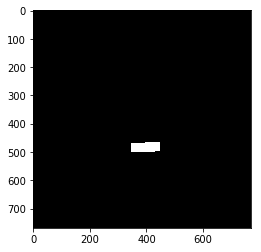

In [7]:
plt.imshow(out,cmap='gray')

In [8]:
# Great it works , Let's see what happens if it's null.

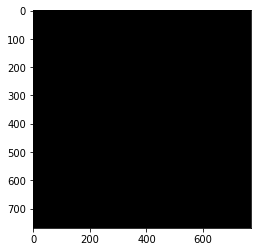

In [9]:
plt.imshow(rle_decode(original_data['EncodedPixels'][0]),cmap='gray')

Good! this function works, Let's make a function to save the image.

In [10]:
def save_numpy_array_to_jpg(name,np_img):
    scipy.misc.imwrite("{0}.jpg".format(name),np_img)
    return

In [11]:
save_numpy_array_to_jpg("test",out)

AttributeError: module 'scipy.misc' has no attribute 'imwrite'

In [12]:
# Test the saved image

back_load = scipy.misc.imread("test.jpg")

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until


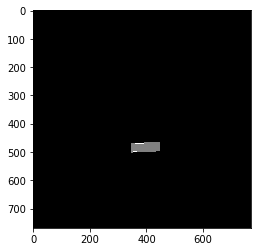

In [13]:
plt.imshow(back_load,cmap='gray')

In [ ]:
original_data.apply(lambda row: print(row['ImageId'] + str(row['EncodedPixels'])),axis=1)

00003e153.jpgnan
0001124c7.jpgnan
000155de5.jpg264661 17 265429 33 266197 33 266965 33 267733 33 268501 33 269269 33 270037 33 270805 33 271573 33 272341 33 273109 33 273877 33 274645 33 275413 33 276181 33 276949 33 277716 34 278484 34 279252 33 280020 33 280788 33 281556 33 282324 33 283092 33 283860 33 284628 33 285396 33 286164 33 286932 33 287700 33 288468 33 289236 33 290004 33 290772 33 291540 33 292308 33 293076 33 293844 33 294612 33 295380 33 296148 33 296916 33 297684 33 298452 33 299220 33 299988 33 300756 33 301524 33 302292 33 303060 33 303827 34 304595 34 305363 33 306131 33 306899 33 307667 33 308435 33 309203 33 309971 33 310739 33 311507 33 312275 33 313043 33 313811 33 314579 33 315347 33 316115 33 316883 33 317651 33 318419 33 319187 33 319955 33 320723 33 321491 33 322259 33 323027 33 323795 33 324563 33 325331 33 326099 33 326867 33 327635 33 328403 33 329171 33 329938 34 330706 34 331474 33 332242 33 333010 33 333778 33 334546 33 335314 33 336082 33 336850 33 337

018b5ba5b.jpg207601 1 208368 3 209135 5 209902 7 210671 7 211440 7 212209 7 212978 7 213747 7 214516 7 215285 5 216054 3 216823 1
018b8ef33.jpg140707 6 141465 16 142223 26 142986 31 143754 31 144522 31 145290 31 146058 32 146826 32 147594 32 148363 31 149131 31 149899 31 150667 25 151435 15 152203 5
018bdb40b.jpgnan
018c0ccba.jpgnan
018c1ff4d.jpgnan
018c28853.jpgnan
018c4ba23.jpg511236 1 512003 3 512769 6 513536 8 514303 9 515070 11 515836 14 516603 16 517370 18 518137 20 518904 21 519670 24 520437 26 521204 28 521973 28 522742 28 523511 27 524279 28 525048 28 525817 28 526586 28 527355 28 528124 28 528892 28 529661 28 530430 28 531199 28 531968 28 532737 28 533505 28 534274 28 535043 28 535812 28 536581 26 537350 24 538119 21 538887 20 539656 18 540425 16 541194 13 541963 11 542732 9 543500 8 544269 6 545038 3 545807 1
018c4ba23.jpg252879 1 253646 4 254414 5 255181 8 255948 11 256716 12 257483 15 258251 16 259018 19 259785 21 260553 23 261320 25 262089 26 262859 26 263628 26 264398 26

02f8a33df.jpgnan
02f8b8b46.jpgnan
02f8cc207.jpgnan
02f8e55db.jpgnan
02f8fd06a.jpgnan
02f944205.jpg503983 4 504748 7 505516 8 506285 7 507053 7 507821 7 508590 7 509358 7 510126 7 510894 7 511663 7 512431 7 513199 7 513968 6 514736 7 515504 7 516273 4 517041 2
02f963055.jpgnan
02f975e35.jpgnan
02f9824a1.jpgnan
02f9d5b11.jpgnan
02fa0399a.jpg471986 1 472754 3 473521 6 474289 7 475059 7 475828 8 476597 8 477367 5 478136 4 478905 2
02fa0399a.jpg465056 1 465823 4 466591 5 467358 7 468125 10 468892 12 469660 13 470427 16 471196 16 471966 15 472735 16 473504 16 474274 15 475043 13 475812 13 476582 13 477351 13 478120 14 478890 13 479659 14 479674 1 480428 16 481198 15 481967 16 482736 16 483506 13 484275 12 485044 10 485814 7 486583 5 487352 4 488122 1
02fa41846.jpg34393 2 35161 4 35928 7 36696 9 37463 13 38231 15 38998 18 39766 20 40533 23 41301 25 42068 26 42836 25 43604 25 44371 25 45139 25 45906 25 46674 25 47441 25 48209 25 48976 25 49744 25 50511 26 51279 25 52047 25 52814 25 53582 25 54

044342421.jpg381000 1 381767 3 382534 6 383302 7 384069 9 384836 12 385603 14 386370 16 387138 17 387905 20 388672 22 389439 24 390206 27 390974 28 391741 30 392508 32 393275 35 394043 36 394810 38 395577 40 396344 43 397111 45 397879 46 398646 49 399413 51 400180 53 400947 55 401715 57 402482 59 403249 61 404018 62 404787 62 405557 61 406326 61 407095 62 407864 62 408634 61 409403 62 410172 62 410941 62 411711 61 412480 62 413249 62 414019 61 414788 61 415557 62 416326 62 417096 61 417865 62 418634 62 419403 62 420173 61 420942 62 421711 62 422480 62 423250 62 424019 62 424788 62 425557 62 426327 62 427096 62 427865 62 428634 63 429404 62 430173 62 430942 62 431712 62 432481 62 433250 62 434019 63 434789 62 435558 62 436327 62 437096 63 437866 62 438635 62 439404 62 440173 63 440943 62 441712 62 442481 63 443250 63 444020 62 444789 62 445558 63 446327 63 447097 62 447866 63 448635 63 449405 62 450174 62 450943 63 451712 63 452482 62 453251 63 454020 63 454789 63 455559 62 456328 63 45

059d3d9f8.jpg559764 2 560530 4 561298 4 562066 5 562835 4 563603 4 564371 4 565139 5 565908 4 566676 2
059d3d9f8.jpg316346 1 317112 4 317879 5 318645 8 319412 10 320181 10 320950 9 321718 10 322487 10 323256 10 324025 9 324794 9 325562 10 326331 10 327100 9 327869 9 328638 9 329407 7 330175 6 330944 3 331713 1
059d3d9f8.jpg135131 2 135899 4 136666 5 137434 4 138201 5 138969 4 139739 2
059d3d9f8.jpg438333 2 439099 4 439865 7 440631 9 441399 7 442168 4 442936 2
059d3d9f8.jpg559751 5 560519 5 561287 5 562055 5 562823 5 563591 4 564359 4 565127 4 565897 2
059d8a8eb.jpgnan
059dc34ed.jpg30230 1 30998 3 31765 6 32533 8 33300 11 34068 13 34835 16 35603 17 36370 17 37138 17 37905 17 38673 17 39440 17 40208 17 40975 17 41743 17 42510 18 43278 17 44045 18 44813 17 45580 18 46348 17 47115 18 47883 17 48650 18 49418 18 50185 18 50953 18 51720 18 52488 18 53255 18 54023 18 54790 18 55558 18 56326 17 57093 18 57861 17 58628 18 59396 17 60163 18 60931 18 61698 18 62466 18 63233 18 64001 18 64768 18 65

07047cef1.jpg26393 4 27161 12 27929 20 28697 28 29465 32 30232 33 31000 33 31768 33 32536 33 33304 32 34072 32 34840 32 35608 32 36376 32 37143 33 37911 33 38679 33 39447 33 40215 32 40983 32 41751 32 42519 32 43287 32 44054 33 44822 33 45590 33 46358 33 47126 32 47894 32 48662 32 49430 32 50198 32 50965 33 51733 33 52501 33 53269 33 54037 32 54805 32 55573 32 56341 32 57109 32 57876 33 58644 33 59412 33 60180 33 60948 32 61716 32 62484 32 63252 32 64020 32 64787 33 65555 33 66323 33 67091 33 67859 32 68627 32 69395 32 70163 32 70931 32 71698 33 72466 33 73234 33 74002 33 74770 32 75538 32 76306 32 77074 32 77842 32 78609 33 79377 33 80145 33 80913 33 81681 32 82449 32 83217 32 83985 32 84753 32 85521 32 86288 33 87056 33 87824 33 88592 33 89360 32 90128 32 90896 32 91664 32 92432 32 93199 33 93967 33 94735 33 95503 33 96271 32 97039 32 97807 32 98575 32 99343 32 100110 33 100878 33 101646 33 102414 33 103182 32 103950 32 104718 32 105486 32 106254 32 107021 33 107789 33 108557 33 1093

085997f5f.jpgnan
085a102d1.jpgnan
085a4de99.jpg4088 7 4856 20 5624 34 6392 47 7160 54 7928 54 8696 54 9463 55 10231 55 10999 55 11767 55 12535 54 13303 54 14071 54 14839 54 15607 54 16375 54 17143 54 17911 54 18678 55 19446 55 20214 55 20982 55 21750 55 22518 54 23286 54 24054 54 24822 54 25590 54 26358 54 27126 54 27894 54 28661 55 29429 55 30197 55 30965 55 31733 55 32501 54 33269 54 34037 54 34805 54 35573 54 36341 54 37109 54 37877 54 38644 55 39412 55 40180 55 40948 55 41716 55 42484 55 43252 54 44020 54 44788 54 45556 54 46324 54 47092 54 47859 55 48627 55 49395 55 50163 55 50931 55 51699 55 52467 55 53235 54 54003 54 54771 54 55539 54 56307 54 57075 54 57842 55 58610 55 59378 55 60146 55 60914 55 61682 55 62450 55 63218 54 63986 54 64754 54 65522 54 66290 54 67057 55 67825 55 68593 55 69361 55 70129 55 70897 55 71665 55 72433 55 73201 54 73969 54 74737 54 75505 54 76273 54 77040 55 77808 55 78576 55 79344 55 80112 55 80880 55 81648 55 82416 55 83184 54 83952 54 84720 54 85488 54

09bcfe6ca.jpgnan
09bd9fba5.jpg178055 1 178821 3 179588 5 180354 7 181121 9 181887 11 182653 14 183420 15 184186 18 184953 18 185719 18 186486 17 187255 15 188023 13 188792 10 189560 8 190329 6 191097 4 191866 1
09bdbae9e.jpgnan
09be21f7e.jpg390889 2 391657 5 392424 10 393192 13 393960 16 394728 20 395495 25 396263 26 397031 26 397799 26 398566 27 399334 27 400102 27 400870 27 401637 28 402405 28 403173 28 403940 29 404708 29 405476 29 406244 29 407011 30 407779 30 408547 30 409315 30 410082 31 410850 31 411618 31 412386 31 413153 32 413921 32 414689 32 415456 33 416224 33 416992 33 417760 33 418527 34 419295 34 420063 34 420831 34 421598 35 422366 35 423134 35 423902 35 424669 36 425437 36 426205 36 426972 37 427740 37 428508 37 429276 37 430043 38 430811 38 431579 38 432347 38 433114 39 433882 39 434650 39 435418 39 436185 40 436953 40 437721 40 438488 41 439256 41 440024 41 440792 41 441559 42 442327 42 443095 42 443863 42 444630 43 445398 43 446166 43 446934 43 447701 44 448469 44 4

0ad505458.jpg33492 1 34259 3 35026 5 35793 7 36562 7 37331 6 38100 6 38869 6 39637 7 40406 7 41175 7 41944 5 42713 3 43482 1
0ad505458.jpg43487 2 44253 4 45022 4 45790 4 46559 4 47328 1
0ad505458.jpg150349 3 151117 5 151885 5 152652 6 153420 5 154188 5 154956 5 155724 5 156491 5 157259 5 158027 5 158795 5 159562 5 160330 5 161098 5
0ad579044.jpgnan
0ad5b4e86.jpgnan
0ad60e273.jpgnan
0ad612b60.jpgnan
0ad660156.jpgnan
0ad685827.jpgnan
0ad692f4c.jpgnan
0ad6cda14.jpgnan
0ad6f471b.jpgnan
0ad6fdb56.jpgnan
0ad70f9ea.jpgnan
0ad77edcb.jpg262107 3 262870 8 263633 13 264396 19 265159 24 265921 30 266684 35 267447 40 268210 46 268973 51 269736 56 270499 61 271262 66 272025 71 272787 78 273550 83 274313 88 275076 93 275839 98 276602 104 277365 109 278128 114 278891 119 279654 124 280416 131 281179 136 281942 141 282705 146 283468 151 284231 157 284994 162 285757 167 286520 172 287282 178 288045 183 288808 189 289571 194 290334 199 291099 202 291867 202 292635 203 293404 202 294172 202 294940 199 295

0bdbf98cc.jpgnan
0bdc171c6.jpgnan
0bdc1dde4.jpgnan
0bdc82e6a.jpgnan
0bdc9fb11.jpgnan
0bdcb56fe.jpg192807 1 193574 3 194341 5 195108 7 195875 9 196642 11 197409 13 198176 15 198943 15 199710 15 200477 15 201244 15 202011 15 202777 16 203544 16 204311 16 205078 16 205845 16 206612 16 207379 16 208146 16 208913 15 209680 15 210447 15 211214 15 211981 15 212748 15 213515 15 214284 13 215053 11 215822 9 216591 7 217360 5 218129 3 218898 1
0bdcc2cf2.jpgnan
0bdcd2ad7.jpgnan
0bdd17ddd.jpgnan
0bdd43d2c.jpgnan
0bde4207e.jpg231604 3 232372 9 233140 15 233908 18 234675 19 235443 19 236211 19 236982 15 237756 9 238530 3
0bde6d2d7.jpgnan
0bdf571d0.jpgnan
0bdf5a360.jpgnan
0bdf9304d.jpgnan
0bdf995a3.jpg22707 1 23474 4 24242 6 25009 9 25777 11 26544 14 27312 16 28079 19 28847 21 29614 24 30381 26 31149 25 31916 26 32684 25 33451 26 34219 25 34986 26 35754 25 36521 26 37288 26 38056 26 38823 26 39591 25 40358 26 41126 25 41893 26 42661 25 43428 26 44195 26 44963 26 45730 26 46498 25 47265 26 48033 25 48

0d5b4a0c3.jpg204327 1 205094 3 205861 5 206628 7 207395 9 208161 11 208928 13 209695 15 210462 17 211229 19 211996 19 212763 19 213530 19 214297 18 215063 19 215830 19 216597 19 217364 19 218131 19 218898 19 219665 18 220432 18 221199 18 221965 19 222732 19 223499 19 224266 19 225033 18 225800 18 226569 16 227338 14 228107 12 228876 10 229645 8 230414 5 231183 3 231952 1
0d5bbab29.jpgnan
0d5c17d53.jpgnan
0d5c2941a.jpgnan
0d5c9ef0a.jpgnan
0d5cb03ba.jpg166705 3 167473 9 168241 15 169009 18 169776 19 170544 19 171312 19 172080 18 172848 18 173616 18 174384 18 175151 19 175919 19 176687 19 177455 18 178223 18 178991 18 179759 18 180526 19 181294 19 182062 19 182830 18 183598 18 184366 18 185134 18 185901 19 186669 19 187437 19 188205 18 188973 18 189741 18 190509 18 191276 19 192044 19 192812 19 193580 18 194348 18 195116 18 195884 18 196651 19 197419 19 198187 19 198955 18 199723 18 200491 18 201259 18 202026 19 202794 19 203562 19 204330 18 205098 18 205866 18 206634 18 207401 19 208169 

0eb308088.jpgnan
0eb3c4321.jpgnan
0eb4122ff.jpg96489 1 97255 4 98022 6 98789 7 99555 10 100322 12 101088 15 101855 17 102622 18 103388 21 104155 23 104924 23 105692 23 106461 23 107230 23 107999 23 108767 24 109536 23 110305 23 111074 23 111842 22 112611 20 113380 17 114149 15 114917 14 115686 11 116455 9 117224 7 117992 6 118761 3 119530 1
0eb419f62.jpgnan
0eb4f9fe7.jpgnan
0eb516558.jpgnan
0eb57d5ed.jpgnan
0eb58a3b8.jpgnan
0eb600731.jpgnan
0eb634f04.jpgnan
0eb6878ce.jpgnan
0eb6b9f79.jpgnan
0eb76e55e.jpgnan
0eb7aba53.jpgnan
0eb7c4631.jpgnan
0eb7e9c71.jpg293643 3 294411 7 295179 11 295946 15 296714 15 297482 15 298250 14 299018 14 299785 15 300553 15 301321 15 302089 14 302857 14 303624 15 304392 15 305160 15 305928 14 306696 14 307463 15 308231 15 308999 14 309767 14 310535 14 311302 15 312070 15 312838 14 313606 14 314374 14 315141 15 315909 15 316677 14 317445 14 318212 15 318980 15 319748 15 320516 14 321284 14 322051 15 322819 15 323587 15 324355 14 325123 14 325890 15 326658 15 32

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




16fea0bfb.jpgnan
16fec7f42.jpgnan
16fee91ea.jpgnan
16feeaf32.jpgnan
16fefda48.jpgnan
16ff0f0da.jpg83637 2 84403 5 85171 5 85940 5 86708 5 87477 5 88245 5 89014 5 89782 5 90551 5 91319 5 92088 5 92856 4 93625 1
16ff1fbc7.jpg344259 11 345027 32 345795 52 346563 73 347331 94 348099 114 348867 135 349634 147 350402 147 351170 147 351938 147 352706 147 353474 147 354242 147 355010 147 355778 147 356546 147 357314 147 358082 147 358849 148 359617 147 360385 147 361153 147 361921 147 362689 147 363457 147 364236 136 365025 115 365814 94 366603 73 367391 53 368180 32 368969 11
16ff79cdc.jpgnan
17001ed51.jpgnan
170094bee.jpgnan
1700de87a.jpgnan
1700e1eea.jpg78019 1 78786 3 79553 5 80320 7 81087 9 81854 11 82621 13 83387 15 84154 17 84921 19 85688 21 86455 23 87222 25 87989 27 88756 29 89525 29 90294 29 91063 29 91832 29 92601 29 93370 29 94138 29 94907 29 95676 29 96445 29 97214 29 97983 29 98752 29 99521 29 100290 29 101059 29 101828 29 102597 29 103366 29 104135 29 104903 29 105672 29 106441

185eee91b.jpg372910 2 373676 4 374442 7 375207 10 375973 13 376739 15 377504 18 378270 21 379035 24 379801 27 380567 29 381332 33 382098 35 382864 37 383630 40 384398 40 385167 40 385935 40 386704 39 387472 40 388241 39 389009 40 389777 40 390546 40 391314 40 392083 39 392851 40 393620 39 394388 40 395156 40 395925 39 396693 40 397462 39 398230 40 398999 39 399767 40 400535 40 401304 39 402072 40 402841 39 403609 40 404378 39 405146 39 405914 40 406683 39 407451 40 408220 39 408988 40 409757 39 410525 39 411293 40 412062 39 412830 40 413599 39 414367 39 415136 39 415904 39 416672 40 417441 39 418209 40 418978 39 419746 39 420515 39 421283 39 422051 40 422820 39 423588 39 424357 39 425125 39 425894 39 426662 39 427430 40 428199 39 428967 39 429736 39 430504 39 431273 39 432041 39 432809 39 433578 39 434346 39 435115 39 435883 39 436652 39 437420 39 438188 39 438957 39 439725 39 440494 39 441262 39 442031 38 442799 39 443567 39 444336 39 445104 39 445873 39 446641 39 447410 38 448178 39 

19f4aef37.jpgnan
19f525c73.jpg413451 4 414219 11 414987 17 415755 24 416522 29 417290 29 418058 29 418826 29 419594 28 420362 28 421129 29 421897 29 422665 29 423433 29 424201 28 424969 28 425736 29 426504 29 427272 29 428040 29 428808 28 429576 28 430343 29 431111 29 431879 29 432647 29 433415 29 434183 28 434950 29 435718 29 436486 29 437254 29 438022 29 438790 28 439557 29 440325 29 441093 29 441861 29 442629 29 443397 28 444164 29 444932 29 445700 29 446468 29 447236 29 448004 29 448771 29 449539 29 450307 29 451075 29 451843 29 452611 29 453378 29 454146 29 454914 29 455682 29 456450 29 457218 29 457985 29 458753 29 459521 29 460289 29 461057 29 461825 29 462592 30 463360 29 464128 29 464896 29 465664 29 466432 29 467199 30 467967 29 468735 29 469503 29 470271 29 471039 29 471806 30 472574 30 473342 29 474110 29 474878 29 475646 29 476413 30 477181 30 477949 29 478717 29 479485 29 480253 29 481020 30 481788 30 482556 29 483324 29 484092 29 484860 29 485627 30 486395 30 487163 30 4

1ba5c19a6.jpgnan
1ba5e262e.jpgnan
1ba69b28b.jpgnan
1ba6b534c.jpgnan
1ba7b252a.jpgnan
1ba8b5043.jpgnan
1ba8b7683.jpgnan
1ba981973.jpgnan
1ba9b4ea1.jpgnan
1ba9b68bf.jpg187628 1 188395 4 189163 6 189930 8 190697 11 191465 12 192232 15 193000 17 193767 19 194534 22 195302 23 196069 26 196836 29 197604 30 198371 33 199138 36 199906 37 200673 40 201440 42 202208 44 202975 47 203743 48 204510 51 205277 53 206045 55 206812 58 207579 60 208347 59 209114 60 209881 60 210649 59 211416 60 212184 59 212951 60 213718 60 214486 59 215253 60 216020 60 216788 59 217555 60 218322 60 219090 59 219857 60 220624 60 221392 59 222159 60 222927 59 223694 60 224461 60 225229 59 225996 60 226763 60 227531 59 228298 60 229065 60 229833 59 230600 60 231367 60 232135 60 232902 60 233670 59 234437 60 235204 60 235972 59 236739 60 237506 60 238274 59 239041 60 239808 60 240576 59 241343 60 242111 59 242878 60 243645 60 244413 59 245180 60 245947 60 246715 59 247482 60 248249 60 249017 59 249784 60 250551 60 251319 5

1d443e970.jpgnan
1d444392a.jpgnan
1d44ae390.jpg49236 3 50004 7 50771 12 51539 16 52307 20 53075 25 53842 30 54610 34 55378 38 56146 42 56913 47 57681 52 58449 56 59217 60 59984 65 60752 69 61520 72 62288 72 63055 73 63823 72 64594 69 65366 65 66138 61 66910 57 67683 51 68455 47 69227 43 69999 39 70772 33 71544 29 72316 25 73088 21 73861 16 74633 11 75405 7 76177 3
1d44ae390.jpg43789 4 44557 10 45325 16 46093 19 46860 20 47628 20 48396 20 49164 19 49936 15 50710 9 51484 3
1d44d9420.jpgnan
1d4502f1b.jpgnan
1d453a699.jpgnan
1d455d686.jpgnan
1d456c89f.jpgnan
1d45b884e.jpgnan
1d4646f58.jpgnan
1d464bee1.jpgnan
1d46a21dc.jpgnan
1d478c480.jpgnan
1d4793c54.jpg280096 3 280864 7 281632 11 282399 16 283167 20 283935 24 284703 28 285470 33 286238 37 287006 41 287774 45 288541 50 289309 54 290077 58 290845 62 291612 67 292380 71 293148 75 293916 79 294683 84 295451 88 296219 92 296987 96 297754 101 298522 105 299290 109 300058 113 300825 118 301593 122 302361 126 303129 130 303896 135 304664 139 305

1ed13a966.jpgnan
1ed1463bd.jpgnan
1ed180cb2.jpgnan
1ed1b3c30.jpgnan
1ed21a591.jpgnan
1ed21d4b7.jpgnan
1ed22f673.jpgnan
1ed244bb3.jpgnan
1ed24ff13.jpgnan
1ed284f52.jpgnan
1ed2b64aa.jpgnan
1ed2f6b1a.jpgnan
1ed3236e1.jpgnan
1ed35b616.jpgnan
1ed35e65d.jpgnan
1ed44d2b3.jpgnan
1ed4793a0.jpg468493 1 469260 3 470026 5 470793 7 471560 9 472327 11 473096 10 473864 11 474633 11 475402 11 476171 10 476939 11 477708 11 478477 11 479246 10 480014 11 480783 9 481552 7 482321 4 483089 3 483858 1
1ed518ea0.jpgnan
1ed54e0d7.jpgnan
1ed56f7e2.jpgnan
1ed57fa35.jpgnan
1ed593a19.jpg443851 1 444617 4 445383 6 446150 8 446916 10 447682 13 448449 14 449215 17 449981 20 450748 21 451514 24 452280 26 453047 28 453813 31 454579 33 455346 35 456112 37 456878 40 457645 41 458411 44 459177 47 459944 48 460710 51 461476 53 462243 55 463009 56 463775 56 464542 55 465308 56 466074 56 466841 55 467607 56 468373 56 469140 55 469906 55 470672 56 471439 55 472205 55 472971 56 473738 55 474504 55 475270 56 476037 55 476803 5

20270be2b.jpgnan
2027cdaea.jpg79224 1 79993 2 80760 5 81528 7 82295 10 83063 12 83830 14 84598 13 85365 14 86133 13 86900 14 87668 13 88435 14 89202 14 89970 14 90737 14 91505 14 92272 14 93040 14 93807 14 94575 13 95342 14 96110 13 96877 14 97644 14 98412 14 99179 14 99947 14 100714 14 101482 14 102249 14 103017 14 103784 14 104551 14 105319 14 106086 14 106854 14 107621 14 108389 14 109156 14 109924 14 110691 14 111459 14 112226 14 112993 15 113761 14 114528 14 115296 14 116063 14 116831 14 117598 14 118366 14 119133 14 119901 14 120671 11 121441 9 122211 6 122981 4 123751 1
2027cdaea.jpg75373 1 76140 4 76908 6 77675 9 78443 11 79210 14 79978 13 80745 14 81513 13 82280 14 83048 13 83815 14 84582 14 85350 14 86117 14 86885 14 87652 14 88420 14 89187 14 89955 13 90722 14 91490 13 92257 14 93024 14 93792 14 94559 14 95327 14 96094 14 96862 14 97629 14 98397 14 99164 14 99931 14 100699 14 101466 14 102234 14 103001 14 103769 14 104536 14 105304 14 106071 14 106839 14 107606 14 108373 15 

21c8e77fd.jpgnan
21c9f9ee5.jpgnan
21ca83cab.jpgnan
21ca8a86f.jpgnan
21cb3a511.jpgnan
21cb7dedd.jpgnan
21cbd72d1.jpgnan
21cc27b7a.jpgnan
21cc9e5b7.jpgnan
21cca1679.jpg238036 1 238802 4 239568 6 240334 9 241100 11 241866 14 242632 16 243398 19 244164 21 244930 24 245696 26 246462 29 247228 31 247994 34 248761 36 249530 35 250298 36 251067 35 251835 36 252604 35 253372 36 254141 35 254909 36 255678 35 256446 36 257215 35 257984 35 258752 35 259521 35 260289 36 261058 35 261826 36 262595 35 263363 36 264132 35 264900 36 265669 35 266438 35 267206 35 267975 35 268743 35 269512 35 270280 36 271049 35 271817 36 272586 35 273354 36 274123 35 274892 35 275660 35 276429 35 277197 35 277966 35 278734 35 279503 35 280271 36 281040 35 281808 36 282577 35 283346 35 284114 35 284883 35 285651 35 286420 35 287188 35 287957 35 288725 35 289494 35 290262 35 291031 35 291800 35 292568 35 293337 35 294105 35 294874 35 295642 35 296411 35 297179 35 297948 35 298716 35 299485 35 300254 34 301022 35 301791 3

22e9d96c7.jpgnan
22ea22736.jpgnan
22ea2df87.jpgnan
22eaa4d87.jpg470288 31 471056 31 471824 31 472592 31 473360 31 474128 31 474896 31 475664 31 476432 31 477200 31 477968 31 478736 31 479504 31 480272 31 481040 31 481808 31 482576 31 483344 31 484112 31 484880 31 485648 31 486416 31
22eaa82c4.jpgnan
22eb4f831.jpgnan
22eb53647.jpgnan
22eb702ec.jpgnan
22ebb0cdd.jpg50 30 818 30 1586 30 2353 31 3121 30 3889 30 4657 30 5425 30 6193 30 6961 30 7728 31 8496 30 9264 30 10032 30 10800 30 11568 30 12336 30 13103 31 13871 30 14639 30 15407 30 16175 30 16943 30 17711 30 18478 31 19246 30 20014 30 20782 30 21550 30 22318 30 23086 30 23853 31 24621 30 25389 30 26157 30 26925 30 27693 30 28460 31 29228 31 29996 30 30764 30 31532 30 32300 30 33068 30 33835 31 34603 30 35371 30 36139 30 36907 30 37675 30 38443 30 39210 31 39978 30 40746 30 41514 30 42282 30 43050 30 43817 31 44585 31 45353 30 46121 30 46889 30 47657 30 48425 30 49192 31 49960 31 50728 30 51496 30 52264 30 53032 30 53800 30 54567 31 553

247f85add.jpgnan
247fd60f1.jpgnan
248081d9a.jpgnan
24809e51e.jpgnan
248183423.jpgnan
2481f29b7.jpgnan
24821dd56.jpgnan
24827a80e.jpgnan
24827da3d.jpgnan
24828e7dd.jpg102583 2 103349 4 104117 5 104886 2
2483b23e9.jpg12895 1 13662 3 14429 5 15196 7 15964 8 16731 10 17498 10 18265 10 19032 10 19801 8 20570 6 21340 3 22109 1
2483b23e9.jpg63058 3 63821 8 64584 13 65346 20 66109 25 66872 30 67635 35 68398 40 69160 47 69923 52 70686 57 71451 57 72219 52 72987 48 73756 42 74524 37 75292 32 76060 28 76828 23 77596 18 78365 12 79133 8 79901 3
2483ec873.jpgnan
2484da0e8.jpgnan
2484dc48a.jpgnan
2484e553a.jpgnan
24858548c.jpgnan
2485cde10.jpgnan
24860ff6d.jpg342434 5 343202 10 343970 10 344738 10 345506 10 346274 10 347042 9 347810 9 348578 9 349346 9 350113 10 350881 10 351649 10 352417 10 353185 10 353953 9 354721 9 355489 9 356257 9 357030 4
24860ff6d.jpg499117 4 499885 8 500653 8 501421 8 502189 8 502957 8 503724 9 504492 8 505260 8 506028 8 506796 8 507564 8 508332 8 509100 8 509868 8 510636 8

25e8e1802.jpgnan
25e948d3a.jpgnan
25e980bfd.jpg517130 6 517898 17 518666 23 519434 23 520202 23 520970 23 521737 24 522505 24 523273 23 524041 23 524809 23 525577 23 526345 23 527113 23 527881 23 528649 23 529416 24 530184 24 530952 23 531720 23 532488 23 533256 23 534024 23 534792 23 535560 23 536328 23 537096 23 537863 24 538631 23 539399 23 540167 23 540935 23 541703 23 542471 23 543239 23 544007 23 544775 23 545542 24 546310 23 547078 23 547846 23 548614 23 549382 23 550150 23 550918 23 551686 23 552454 23 553222 23 553989 24 554757 23 555525 23 556293 23 557061 23 557829 23 558597 23 559365 23 560133 23 560901 23 561668 24 562436 23 563204 23 563972 23 564740 23 565508 23 566276 23 567044 23 567812 23 568580 23 569347 24 570115 23 570883 23 571651 23 572419 23 573187 23 573955 23 574723 23 575491 23 576259 23 577027 23 577794 23 578562 23 579330 23 580098 23 580866 23 581634 23 582402 23 583170 23 583938 23 584706 23 585473 23 586241 23 587009 23 587777 23 588545 23 589313 23
25e9

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2dc872414.jpg146652 2 147420 4 148187 8 148955 10 149722 14 150490 16 151258 18 152025 19 152793 18 153560 19 154328 18 155095 19 155863 19 156631 18 157398 19 158166 18 158933 19 159701 19 160469 18 161236 19 162004 18 162771 19 163539 18 164306 19 165074 19 165842 18 166609 19 167377 18 168144 19 168912 19 169680 18 170447 19 171215 18 171982 19 172750 19 173518 18 174285 19 175053 18 175820 19 176588 19 177355 19 178123 19 178891 18 179658 19 180426 18 181193 19 181961 19 182729 18 183496 19 184264 18 185031 19 185799 19 186566 19 187334 19 188102 18 188869 19 189637 19 190404 19 191172 19 191940 18 192707 19 193475 19 194242 19 195010 19 195777 19 196545 19 197313 18 198080 19 198848 19 199615 19 200383 19 201153 16 201923 14 202693 12 203463 9 204233 7 205003 4 205773 2
2dc872414.jpg79480 1 80249 2 81016 5 81784 7 82551 10 83319 12 84086 14 84854 13 85621 14 86389 13 87156 14 87924 13 88691 14 89458 14 90226 14 90993 14 91761 14 92528 14 93296 14 94063 14 94831 13 95598 14 96366 1

2ed658a49.jpgnan
2ed67991c.jpgnan
2ed67b004.jpgnan
2ed6d96c3.jpgnan
2ed760677.jpgnan
2ed7809b6.jpgnan
2ed815b0b.jpgnan
2ed841d2a.jpgnan
2ed8a1dce.jpgnan
2ed8bbbde.jpgnan
2ed97776e.jpgnan
2ed9a2f71.jpg480529 2 481297 4 482065 4 482832 5 483600 4 484368 4 485138 2
2edaad1b1.jpgnan
2edb6c29d.jpgnan
2edb7e04b.jpg98415 10 99165 28 99914 47 100664 65 101413 84 102163 102 102921 112 103689 112 104457 112 105225 112 105993 112 106761 113 107529 113 108297 113 109065 113 109833 113 110601 113 111370 112 112138 112 112906 112 113674 112 114442 112 115210 102 115978 84 116746 65 117514 47 118282 28 119050 10
2edc609b0.jpgnan
2edc6134b.jpgnan
2edc6b6bc.jpgnan
2edc8e6b6.jpgnan
2edd341e2.jpgnan
2edd7be25.jpg127252 2 128018 4 128784 7 129550 9 130317 11 131085 11 131854 11 132622 11 133391 11 134159 11 134928 11 135696 11 136465 11 137233 11 138002 11 138770 11 139539 11 140307 11 141076 11 141844 11 142613 11 143381 11 144150 11 144918 11 145687 11 146455 11 147224 11 147992 11 148761 11 149529 11 1

301e5aaed.jpgnan
301e92aa0.jpg366212 29 366924 85 367635 142 368346 199 369058 255 369797 284 370565 284 371333 284 372101 284 372869 284 373637 284 374405 284 375173 284 375941 284 376709 284 377477 284 378245 284 379013 284 379781 284 380549 284 381317 284 382085 284 382853 284 383621 284 384389 284 385157 284 385925 284 386693 285 387461 285 388229 285 388997 285 389765 285 390534 284 391302 284 392070 284 392838 284 393606 284 394374 284 395142 284 395910 284 396678 284 397446 284 398214 284 398982 284 399750 284 400518 284 401286 284 402054 284 402822 284 403590 284 404358 284 405126 284 405894 284 406662 284 407430 255 408198 199 408966 142 409734 85 410502 29
301e9677a.jpgnan
301edcc5a.jpgnan
301f14b04.jpgnan
301f6a6b4.jpgnan
302015ab6.jpgnan
30207273a.jpg466301 21 467069 21 467837 21 468605 21 469373 21 470141 21 470909 21
3020857a7.jpg486685 1 487452 3 488219 6 488987 7 489754 9 490521 11 491288 13 492055 16 492823 17 493590 19 494357 21 495124 24 495891 26 496659 27 497426 29

31820cdbf.jpgnan
31821cb63.jpgnan
318222f2a.jpgnan
3182779a2.jpgnan
3182bfdae.jpgnan
3183fe988.jpg542670 1 543436 4 544203 5 544970 7 545739 6 546507 7 547276 6 548044 7 548813 6 549581 7 550350 6 551118 7 551887 5 552655 3 553424 1
3183fe988.jpg459654 1 460421 3 461188 5 461956 6 462723 8 463490 11 464259 11 465028 11 465797 11 466566 11 467335 11 468105 10 468874 8 469643 6 470412 5 471181 3 471950 1
3183fe988.jpg448078 1 448844 4 449610 6 450377 8 451143 10 451910 12 452679 11 453447 12 454216 12 454984 12 455753 12 456521 12 457290 12 458059 10 458827 8 459596 5 460364 4 461133 1
3183fe988.jpg568070 2 568838 6 569605 11 570373 15 571143 15 571915 11 572687 6 573459 2
3183fe988.jpg485840 2 486607 5 487375 7 488142 10 488909 12 489677 12 490444 12 491214 10 491984 7 492754 5 493524 2
3184ef91c.jpgnan
318521389.jpgnan
3185338bc.jpgnan
31853a6c2.jpgnan
3186db29e.jpg62478 3 63240 9 64002 15 64764 22 65526 28 66288 34 67050 40 67812 46 68574 52 69336 59 70098 65 70860 71 71622 77 72384 8

32a038814.jpgnan
32a0a4044.jpgnan
32a0be1b9.jpgnan
32a10969f.jpgnan
32a1ab1c0.jpgnan
32a254a2d.jpg271367 3 272133 5 272901 5 273669 5 274437 5 275205 5 275973 6 276742 5 277510 5 278278 5 279046 5 279814 2
32a2cd058.jpg230166 5 230926 13 231686 21 232446 29 233206 38 233966 46 234726 54 235486 62 236249 67 237017 67 237785 67 238553 67 239321 68 240090 67 240858 67 241626 67 242394 67 243162 67 243930 67 244698 67 245466 68 246235 67 247003 67 247771 67 248539 67 249307 67 250075 67 250843 67 251611 68 252380 67 253148 67 253916 67 254684 67 255452 67 256220 67 256988 67 257756 68 258525 67 259293 67 260061 67 260829 67 261597 67 262365 67 263133 67 263901 68 264670 67 265438 67 266206 67 266974 67 267742 67 268510 67 269278 67 270046 68 270815 67 271583 67 272351 67 273119 67 273887 67 274655 67 275423 68 276191 68 276960 67 277728 67 278496 67 279264 67 280032 67 280800 67 281568 68 282336 68 283105 67 283873 67 284641 67 285409 67 286177 67 286945 67 287713 68 288481 68 289250 67 29

3426a5e8b.jpgnan
342709d08.jpgnan
34283118e.jpgnan
342831f65.jpgnan
34288b063.jpg117923 1 118690 4 119458 6 120225 9 120993 11 121760 13 122528 15 123295 18 124063 20 124830 22 125597 22 126365 22 127132 22 127900 22 128667 22 129435 22 130202 22 130970 22 131737 22 132504 22 133272 22 134039 22 134807 22 135574 22 136342 22 137109 22 137876 23 138644 22 139411 22 140179 22 140946 22 141714 22 142481 22 143249 22 144016 22 144783 22 145551 22 146318 22 147086 22 147853 22 148621 22 149388 22 150156 22 150923 22 151690 22 152458 22 153225 22 153993 22 154760 22 155528 22 156295 22 157063 22 157830 22 158597 22 159365 22 160132 22 160900 22 161667 22 162435 22 163202 22 163970 22 164737 22 165504 22 166272 22 167039 22 167807 22 168574 22 169342 22 170109 22 170877 22 171644 22 172411 22 173179 22 173946 22 174714 22 175481 22 176249 22 177016 22 177783 23 178551 22 179318 22 180086 22 180853 22 181621 22 182388 22 183156 22 183923 22 184690 22 185458 22 186225 22 186993 22 187760 22 188

35e14c452.jpgnan
35e176f5a.jpgnan
35e19298b.jpgnan
35e256a90.jpgnan
35e26df06.jpgnan
35e2983d0.jpg481288 50 482056 100 482824 100 483592 100 484360 100 485128 100 485896 100 486664 100 487431 101 488199 100 488967 100 489735 100 490503 100 491271 100 492039 100 492857 50
35e2983d0.jpg312984 11 313752 32 314520 53 315288 73 316056 94 316824 115 317592 126 318360 126 319128 126 319896 126 320664 126 321431 127 322199 127 322967 127 323735 127 324503 127 325271 127 326039 126 326807 126 327575 126 328343 126 329122 115 329911 94 330700 73 331488 53 332277 32 333066 11
35e2983d0.jpg564997 98 565765 98 566533 98 567301 98 568069 98 568837 98 569605 98 570373 98 571141 98 571909 98 572677 98 573445 98 574213 98 574981 98
35e2983d0.jpg478083 26 478851 76 479619 101 480387 101 481155 101 481923 101 482691 101 483459 101 484227 101 484995 101 485763 101 486531 101 487299 101 488067 101 488861 75 489679 25
35e2983d0.jpg316994 21 317762 61 318530 101 319298 121 320066 121 320834 121 321602 121 32

371a72c72.jpgnan
371aa21cb.jpgnan
371b1050c.jpgnan
371b45f2f.jpgnan
371bcf78c.jpgnan
371c19afd.jpgnan
371c2f80a.jpgnan
371c87a10.jpg46871 2 47639 6 48406 9 49174 9 49942 8 50710 8 51477 9 52245 9 53013 8 53780 9 54548 9 55316 8 56084 8 56851 9 57619 9 58387 8 59154 9 59922 9 60690 8 61458 8 62225 9 62993 9 63763 6 64535 2
371d06add.jpgnan
371d16ce2.jpg185289 7 186044 20 186800 32 187555 45 188310 58 189066 71 189821 84 190576 97 191332 109 192087 122 192842 135 193598 147 194359 154 195127 154 195895 154 196663 155 197431 155 198199 155 198967 155 199735 155 200504 154 201272 154 202040 154 202808 154 203576 154 204344 155 205112 155 205880 155 206648 155 207416 155 208184 148 208952 135 209720 123 210488 110 211257 96 212025 83 212793 71 213561 58 214329 45 215097 32 215865 20 216633 7
371d16ce2.jpg12132 9 12883 26 13634 43 14385 60 15135 78 15886 95 16637 112 17388 129 18139 147 18898 156 19666 156 20434 156 21202 156 21970 156 22738 156 23506 156 24274 156 25043 155 25811 155 26579 

3886bb218.jpgnan
3886cc6ff.jpgnan
388786cd4.jpgnan
3887896c3.jpgnan
3887f194a.jpg281466 1 282232 4 282999 6 283768 6 284537 5 285306 5 286074 6 286843 6 287612 4 288381 1
3887f2141.jpg390314 1 391081 4 391848 6 392617 7 393387 6 394156 6 394925 7 395695 6 396464 5 397233 3 398003 1
3887f9861.jpgnan
38880b491.jpgnan
38880e348.jpgnan
3888ed9c3.jpgnan
388974c0f.jpgnan
3889c02c3.jpgnan
388a196d6.jpgnan
388a93a4b.jpgnan
388a9cd4e.jpgnan
388b45550.jpgnan
388bbdf1d.jpgnan
388bd1e22.jpg259881 1 260648 3 261414 6 262181 7 262948 9 263715 11 264481 14 265248 16 266015 17 266782 19 267548 22 268315 24 269082 26 269849 27 270616 29 271382 32 272149 34 272916 36 273683 37 274449 40 275216 42 275983 44 276750 46 277516 48 278283 50 279050 52 279817 54 280583 57 281350 58 282117 60 282884 62 283650 63 284417 63 285184 62 285951 62 286717 63 287484 63 288251 62 289018 62 289785 62 290551 63 291318 62 292085 62 292852 62 293618 63 294385 63 295152 62 295919 62 296685 63 297452 63 298219 62 298986 62 29

3a26743e4.jpgnan
3a2745976.jpgnan
3a2790d4d.jpgnan
3a2864ae3.jpg73472 6 74240 16 75008 22 75776 22 76544 22 77312 22 78080 22 78848 22 79615 23 80383 22 81151 22 81919 22 82687 22 83455 22 84223 22 84991 22 85759 22 86527 22 87295 22 88063 22 88831 22 89599 22 90367 21 91135 21 91902 22 92670 22 93438 22 94206 22 94974 22 95742 22 96510 22 97278 22 98046 22 98814 22 99582 21 100350 21 101118 21 101886 21 102654 21 103421 22 104189 22 104957 22 105725 22 106493 22 107261 22 108029 22 108797 22 109565 21 110333 21 111101 21 111869 21 112637 21 113405 21 114173 21 114940 22 115708 22 116476 22 117244 22 118012 22 118780 22 119548 21 120316 21 121084 21 121852 21 122620 21 123388 21 124156 21 124924 21 125692 21 126460 21 127227 22 127995 22 128763 21 129531 21 130299 21 131067 21 131835 21 132603 21 133382 10
3a2864ae3.jpg59188 2 59956 4 60723 7 61491 9 62258 12 63026 12 63793 12 64561 12 65328 12 66096 12 66863 12 67631 12 68401 9 69171 7 69941 4 70711 2
3a28c9618.jpg297598 1 298365 4 29

3b5086f4e.jpg335988 70 336756 70 337524 70 338292 70 339060 70 339828 70 340596 70 341364 70 342132 70 342900 70 343668 70 344436 70 345204 70 345972 70 346740 70 347508 70 348276 70 349044 70 349812 70 350580 70 351348 70 352116 70 352884 70 353652 70 354420 70 355188 70 355956 70 356724 70 357492 70 358260 70 359028 70 359796 70 360564 70 361332 70 362100 70
3b511fc9d.jpg256065 1 256832 4 257600 5 258367 8 259134 10 259902 12 260669 15 261437 16 262204 19 262971 21 263739 23 264506 25 265273 28 266041 29 266808 32 267576 34 268343 36 269110 39 269878 40 270645 43 271412 45 272180 47 272947 49 273714 52 274482 53 275249 56 276017 58 276784 60 277551 63 278319 64 279086 67 279853 69 280621 68 281388 69 282156 68 282923 68 283690 69 284458 68 285225 69 285992 69 286760 68 287527 69 288295 68 289062 68 289829 69 290597 68 291364 69 292131 69 292899 68 293666 69 294433 69 295201 68 295968 69 296736 68 297503 68 298270 69 299038 68 299805 69 300572 69 301340 68 302107 69 302875 68 303642 6

3c9de8b8d.jpgnan
3c9df849a.jpgnan
3c9e410bf.jpgnan
3c9e6ff03.jpg160577 30 161345 30 162113 30 162881 30 163649 30 164417 30 165185 30 165953 30 166721 30 167489 30 168257 30 169025 30 169793 30 170561 30 171329 30 172097 30 172865 30 173633 30 174401 30 175169 30 175937 30 176705 30 177473 30 178241 30 179009 30 179777 30 180545 30 181313 30 182081 30 182849 30 183617 30 184385 30 185153 30 185921 30 186689 30 187457 30 188225 30 188993 30 189761 30 190529 30 191297 30 192065 30 192833 30 193601 30 194369 30 195137 30 195905 30 196673 30 197441 30 198209 30 198977 30 199745 30 200513 30 201281 30 202049 30 202817 30 203585 30 204353 30 205121 30 205889 30 206657 30 207425 30 208193 30 208961 30 209729 30 210497 30 211265 30 212033 30 212801 30 213569 30 214337 30 215105 30 215873 30 216641 30 217409 30 218177 30 218945 30 219713 30 220481 30 221250 29 222018 29 222786 29 223554 29 224322 29 225090 29 225858 29 226626 29 227394 29 228162 29 228930 29 229698 29 230466 29 231234 29 232002

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



44a3829a2.jpgnan
44a39fbf9.jpgnan
44a3b56b3.jpgnan
44a3b9dc6.jpgnan
44a3d9e66.jpgnan
44a446ef4.jpgnan
44a522593.jpgnan
44a57c943.jpgnan
44a5e3528.jpgnan
44a6b191d.jpgnan
44a6c7656.jpgnan
44a6d3b89.jpg450737 5 451501 9 452269 9 453037 9 453805 9 454573 9 455341 9 456110 9 456878 9 457646 9 458414 9 459182 9 459950 9 460718 9 461486 9 462254 9 463022 9 463790 9 464558 9 465327 9 466095 9 466863 9 467631 9 468399 9 469167 9
44a6d3b89.jpg99717 6 100485 6 101253 6 102021 6 102789 6 103557 6 104324 7 105092 7 105860 7 106628 7 107396 7 108164 6 108932 6 109700 6 110468 6 111236 6 112003 7 112771 7 113539 7 114307 7 115075 7
44a754768.jpgnan
44a75617d.jpg444400 11 445168 11 445936 11 446704 11 447472 11 448241 10 449009 10 449777 11 450545 11 451313 11 452081 11 452849 11 453617 11 454385 11 455153 11 455922 10 456690 10 457458 10 458226 10 458994 10 459762 10 460530 11 461298 11 462066 11 462835 10 463603 10 464371 10 465139 10 465907 5
44a7ea18b.jpgnan
44a7eb89e.jpgnan
44a897282.jpg159010 1

461ac760e.jpg352191 1 352958 3 353725 5 354492 5 355259 5 356026 5 356793 5 357562 3 358331 1
461ac760e.jpg388273 9 389041 9 389808 9 390576 9
461ac760e.jpg300800 1 301567 3 302335 4 303102 4 303869 5 304636 5 305404 5 306171 5 306938 5 307707 4 308477 1
461afb44c.jpg304258 3 305022 7 305788 9 306556 10 307324 10 308093 9 308861 9 309629 10 310397 10 311166 9 311934 9 312702 9 313470 10 314239 9 315007 9 315775 9 316543 10 317312 9 318080 9 318848 4
461afb44c.jpg88358 2 89124 4 89890 7 90658 7 91427 7 92195 7 92964 7 93732 7 94501 6 95269 7 96037 7 96806 7 97574 7 98343 7 99111 7 99880 4 100648 2
461afb44c.jpg116017 1 116783 4 117550 3 118317 5 119083 5 119850 5 120617 6 121386 4 122154 3 122923 1
461afb44c.jpg119857 2 120624 3 121392 4 122161 3 122929 4 123698 5 124466 4 125235 1
461afb44c.jpg153681 2 154445 6 155211 8 155979 9 156747 9 157516 8 158284 8 159052 9 159820 9 160589 8 161357 8 162125 9 162893 9 163662 8 164430 8 165198 9 165966 9 166735 6 167503 2
461afb44c.jpg116787 2 11

47652b556.jpg6822 2 7590 5 8357 9 9125 11 9893 14 10660 18 11428 21 12196 24 12963 27 13731 30 14499 33 15266 37 16034 40 16802 42 17569 46 18337 49 19104 52 19872 52 20640 51 21407 52 22175 52 22943 51 23710 52 24478 52 25246 51 26013 52 26781 52 27549 51 28316 52 29084 52 29852 51 30619 52 31387 51 32155 51 32922 52 33690 51 34458 51 35225 52 35993 51 36761 51 37528 52 38296 51 39064 51 39831 52 40599 51 41367 51 42134 52 42902 51 43669 52 44437 52 45205 51 45972 52 46740 52 47508 51 48275 52 49043 52 49811 51 50578 52 51346 52 52114 51 52881 52 53649 52 54417 51 55184 52 55952 51 56720 51 57487 52 58255 51 59023 51 59790 52 60558 51 61326 51 62093 52 62861 51 63629 51 64396 52 65164 51 65931 52 66699 52 67467 51 68234 52 69002 52 69770 51 70537 52 71305 52 72073 51 72840 52 73608 52 74376 51 75143 52 75911 52 76679 51 77446 52 78214 51 78982 51 79749 52 80517 51 81285 51 82052 52 82820 51 83588 51 84355 52 85123 51 85891 51 86658 52 87426 51 88194 51 88961 52 89729 51 90496 52 91264

48f122eff.jpg419613 1 420379 3 421145 6 421911 8 422677 11 423443 13 424209 16 424976 16 425745 13 426513 11 427282 8 428051 6 428819 4 429588 1
48f1fc565.jpgnan
48f20d64f.jpgnan
48f22d965.jpgnan
48f257e21.jpg523885 6 524647 12 525415 12 526183 12 526951 12 527719 12 528487 12 529255 13 530024 12 530792 12 531560 12 532328 12 533096 12 533864 12 534632 12 535400 12 536168 12 536936 12 537704 12 538472 13 539241 12 540009 12 540777 12 541545 12 542313 12 543081 12 543849 6
48f3cd9a5.jpgnan
48f3d70cb.jpgnan
48f465705.jpgnan
48f494257.jpgnan
48f53af86.jpgnan
48f5c4e6c.jpgnan
48f631873.jpgnan
48f6bf18d.jpg502957 1 503724 4 504492 5 505259 8 506026 10 506793 13 507561 14 508328 17 509097 17 509867 17 510636 17 511406 16 512175 15 512945 13 513714 13 514484 11 514497 1 515253 13 516023 10 516792 8 517562 5 518331 4 519101 1
48f6bf18d.jpg489915 4 490679 8 491447 8 492216 8 492984 8 493752 8 494520 8 495289 8 496057 8 496825 8 497593 8 498362 8 499130 8 499898 8 500666 8 501435 7 502203 8 5029

4aa533340.jpgnan
4aa57e13c.jpg106106 1 106873 4 107641 6 108408 8 109176 7 109943 7 110712 6 111482 3 112251 1
4aa611338.jpgnan
4aa6737d5.jpgnan
4aa72d2e9.jpgnan
4aa7a32a0.jpgnan
4aa7a3bd6.jpgnan
4aa8029b3.jpgnan
4aa8963f1.jpgnan
4aa89eb80.jpgnan
4aa8daa90.jpgnan
4aa9e3cdf.jpg70301 2 71067 4 71833 7 72599 9 73365 12 74131 14 74896 18 75662 20 76428 23 77194 25 77960 28 78726 30 79491 34 80257 36 81023 38 81789 41 82555 43 83321 46 84087 48 84855 49 85624 48 86392 49 87161 48 87929 49 88698 48 89466 49 90235 48 91003 49 91772 48 92540 48 93309 48 94077 48 94845 49 95614 48 96382 49 97151 48 97919 49 98688 48 99456 49 100225 48 100993 49 101762 48 102530 48 103299 48 104067 48 104835 49 105604 48 106372 49 107141 48 107909 49 108678 48 109446 49 110215 48 110983 49 111752 48 112520 49 113289 48 114057 48 114825 49 115594 48 116362 49 117131 48 117899 49 118668 48 119436 49 120205 48 120973 49 121742 48 122510 49 123279 48 124047 48 124815 49 125584 48 126352 49 127121 48 127889 49 128658

4be39ce24.jpg336615 1 337382 4 338150 6 338917 8 339685 10 340452 13 341220 15 341987 17 342754 20 343522 22 344289 24 345057 26 345824 29 346592 30 347359 30 348128 29 348898 26 349668 24 350437 22 351207 20 351977 17 352747 14 353516 13 354286 10 355056 8 355825 6 356595 4 357365 1
4be39da27.jpg334416 12 335184 12 335952 12 336720 12 337488 12 338256 12 339024 12 339792 12 340560 12 341328 12 342096 12 342864 12 343632 12 344400 12 345168 12 345936 12
4be39da27.jpg555178 2 555946 4 556713 7 557481 9 558248 12 559016 14 559783 17 560551 17 561318 17 562086 17 562853 17 563621 17 564388 17 565156 17 565926 14 566696 12 567466 9 568236 7 569006 4 569776 2
4be4005b5.jpg34451 3 35219 7 35987 12 36754 17 37522 21 38290 24 39058 24 39825 25 40593 24 41361 24 42129 24 42897 24 43664 24 44432 24 45200 24 45968 24 46735 24 47503 24 48271 24 49039 24 49807 23 50574 24 51342 24 52110 24 52878 23 53645 24 54413 24 55181 24 55949 24 56717 23 57484 24 58252 24 59020 24 59788 23 60555 24 61323 24 62

4d286b065.jpg361703 7 362464 14 363232 14 364000 14 364768 14 365537 13 366305 13 367073 6
4d2924da0.jpgnan
4d293b76c.jpgnan
4d29aeaaf.jpgnan
4d29c58b7.jpg417429 2 418195 4 418961 7 419727 9 420493 12 421259 14 422025 17 422791 19 423556 23 424322 25 425088 28 425854 30 426620 33 427386 35 428152 38 428917 41 429683 44 430449 46 431215 48 431981 51 432747 53 433513 56 434279 58 435044 62 435810 64 436576 67 437342 69 438108 72 438874 74 439640 77 440406 79 441171 83 441937 85 442703 88 443469 90 444235 93 445001 95 445767 95 446533 95 447298 96 448064 96 448830 96 449596 96 450362 96 451128 96 451894 96 452659 97 453425 96 454191 96 454957 96 455723 96 456489 96 457255 96 458021 96 458786 97 459552 97 460318 96 461084 96 461850 96 462616 96 463382 96 464148 96 464913 97 465679 97 466445 97 467211 97 467977 96 468743 96 469509 96 470275 96 471040 97 471806 97 472572 97 473338 97 474104 97 474870 96 475636 96 476401 97 477167 97 477933 97 478699 97 479465 97 480231 97 480997 97 481763 97

4e3c85fa3.jpgnan
4e3dd487e.jpgnan
4e3e876cb.jpgnan
4e3ecc98e.jpgnan
4e3f0edca.jpgnan
4e3f1389c.jpgnan
4e3f50aac.jpgnan
4e3f9df22.jpg61130 4 61892 10 62656 14 63424 15 64192 15 64961 14 65729 14 66497 14 67265 15 68033 15 68802 14 69570 14 70338 14 71106 15 71874 15 72643 14 73411 14 74179 15 74947 15 75715 15 76484 14 77252 14 78020 15 78788 15 79556 15 80325 14 81093 14 81861 15 82629 15 83397 15 84166 11 84934 7 85702 3
4e3f9df22.jpg151237 2 152002 5 152767 9 153532 12 154297 15 155062 19 155827 22 156593 24 157361 25 158130 24 158898 24 159666 25 160435 24 161203 24 161971 25 162740 24 163508 24 164276 25 165044 25 165813 24 166581 25 167349 25 168118 24 168886 24 169654 25 170423 24 171191 24 171959 25 172728 24 173496 24 174264 25 175033 24 175801 24 176569 25 177338 24 178106 24 178874 25 179642 25 180411 24 181179 25 181947 25 182716 24 183484 25 184252 25 185021 24 185789 25 186557 25 187326 24 188094 25 188862 25 189631 24 190399 25 191167 25 191935 25 192704 25 193472 25 1942

4f9abd07a.jpgnan
4f9c0d40e.jpgnan
4f9c93a15.jpgnan
4f9cd41b8.jpg100861 1 101627 4 102393 6 103160 8 103926 10 104692 13 105459 15 106225 17 106991 20 107758 21 108524 24 109290 26 110057 28 110823 31 111589 33 112355 36 113122 37 113888 40 114654 43 115421 44 116187 47 116953 49 117720 51 118486 53 119252 56 120019 58 120785 60 121551 63 122318 64 123084 67 123850 68 124617 67 125383 67 126149 68 126916 67 127682 67 128448 68 129215 67 129981 67 130747 68 131514 67 132280 67 133046 68 133812 68 134579 67 135345 67 136111 68 136878 67 137644 67 138410 68 139177 67 139943 67 140709 68 141476 67 142242 67 143008 68 143775 67 144541 67 145307 68 146074 67 146840 67 147606 68 148373 67 149139 67 149905 68 150672 67 151438 67 152204 68 152971 67 153737 67 154503 68 155269 68 156036 67 156802 67 157568 68 158335 67 159101 67 159867 68 160634 67 161400 67 162166 68 162933 67 163699 67 164465 68 165232 67 166001 64 166769 63 167538 60 168306 58 169075 56 169844 53 170612 51 171381 49 172149 47 

512a236e6.jpgnan
512a87109.jpgnan
512aa0f42.jpgnan
512ab661d.jpgnan
512ae23c1.jpgnan
512af8140.jpgnan
512b096ac.jpgnan
512b113b4.jpgnan
512c5ea04.jpgnan
512cc8332.jpg238339 1 239106 5 239874 7 240641 8 241409 7 242177 7 242944 7 243712 7 244479 8 245247 7 246015 7 246782 8 247550 7 248318 7 249085 7 249853 7 250620 8 251388 7 252156 7 252923 8 253691 7 254458 8 255228 5 255999 2
512cc8332.jpg226034 2 226802 5 227569 8 228337 11 229105 14 229872 17 230640 20 231407 23 232175 23 232943 22 233710 23 234478 22 235246 22 236013 23 236781 22 237548 23 238316 22 239084 22 239851 22 240619 22 241387 21 242154 22 242922 22 243690 21 244457 22 245225 22 245992 22 246760 22 247528 21 248295 22 249063 22 249831 21 250598 22 251366 22 252133 22 252901 22 253669 21 254436 22 255204 22 255972 22 256739 22 257507 22 258275 21 259042 22 259810 22 260577 22 261345 22 262113 22 262880 22 263648 22 264416 21 265183 22 265951 22 266718 22 267486 22 268254 21 269021 22 269789 22 270559 19 271329 17 272100 1

5266386ad.jpg36653 3 37417 7 38182 10 38950 11 39718 11 40487 10 41255 10 42023 11 42791 11 43560 10 44328 10 45096 11 45864 11 46633 10 47401 10 48169 11 48937 11 49706 10 50474 10 51242 11 52010 11 52779 10 53547 10 54315 11 55083 11 55852 10 56620 10 57388 11 58156 11 58925 10 59693 10 60461 11 61229 11 61998 10 62766 10 63534 11 64302 11 65071 10 65839 10 66607 11 67375 11 68144 10 68912 7 69680 3
526725099.jpgnan
526787799.jpgnan
5267fb449.jpgnan
5268668ba.jpgnan
5269dbbb3.jpgnan
5269ddbfc.jpg214311 2 215079 5 215846 10 216614 13 217382 16 218149 20 218917 24 219685 27 220452 31 221220 35 221988 38 222755 42 223523 45 224291 49 225059 52 225826 56 226594 59 227362 63 228129 67 228897 70 229665 73 230432 78 231200 81 231968 84 232735 89 233503 92 234271 95 235038 99 235806 103 236576 104 237348 103 238119 103 238890 104 239662 103 240433 103 241204 104 241976 103 242747 103 243518 103 244290 103 245061 103 245832 103 246604 102 247375 103 248146 103 248918 102 249689 102 250460 103

53ab5692a.jpg204335 3 205099 7 205864 11 206632 11 207401 10 208169 11 208937 11 209706 10 210474 11 211242 11 212011 10 212779 10 213547 11 214315 11 215084 10 215852 11 216620 11 217389 10 218157 11 218925 11 219694 7 220462 3
53ab5692a.jpg402467 3 403231 7 403996 10 404764 11 405533 10 406301 10 407069 10 407837 11 408606 10 409374 10 410142 10 410910 10 411679 10 412447 10 413215 10 413983 10 414752 10 415520 10 416288 10 417056 8 417825 4 418593 2
53abde749.jpgnan
53abdfeaa.jpgnan
53aca2a8a.jpgnan
53acad235.jpgnan
53acc06f4.jpgnan
53ad27813.jpg388396 1 389162 4 389928 6 390694 9 391460 11 392226 14 392992 16 393758 19 394524 21 395290 24 396056 26 396822 29 397588 31 398354 34 399120 36 399886 39 400653 40 401422 40 402190 40 402959 40 403727 40 404496 40 405264 40 406033 40 406801 40 407570 40 408338 40 409107 40 409875 40 410644 40 411412 40 412181 40 412949 40 413718 40 414486 40 415255 40 416023 40 416792 40 417560 40 418329 40 419097 40 419866 40 420634 40 421403 40 422171 40

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




5d31c97d1.jpg326725 2 327493 4 328260 7 329028 9 329795 11 330563 11 331330 11 332098 11 332866 10 333633 11 334401 10 335168 11 335936 10 336703 11 337471 10 338241 8 339012 4 339782 2
5d3283882.jpgnan
5d3300a02.jpgnan
5d330b3a1.jpgnan
5d33df8bd.jpgnan
5d34250bd.jpgnan
5d34a48b8.jpg260904 1 261671 4 262439 5 263206 7 263973 10 264740 12 265508 14 266275 16 267042 18 267810 20 268577 22 269344 25 270111 27 270879 28 271646 31 272413 33 273180 36 273948 37 274715 39 275482 42 276250 43 277017 46 277784 48 278551 50 279319 52 280086 2 280089 51 280859 51 281628 51 282397 51 283167 51 283936 51 284705 52 285475 51 286244 51 287014 51 287783 51 288552 52 289322 51 290091 51 290861 51 291630 51 292399 52 293169 51 293938 51 294707 52 295477 51 296246 52 297016 51 297785 51 298554 52 299324 51 300093 52 300863 51 301632 51 302401 52 303171 51 303940 52 304709 52 305479 51 306248 52 307018 51 307787 52 308556 52 309326 51 310095 52 310865 51 311634 52 312403 52 313173 51 313942 52 314711 52 

5ec892e04.jpgnan
5ec89a72a.jpgnan
5ec8a3805.jpgnan
5ec8ae0ac.jpgnan
5ec909258.jpgnan
5ec976248.jpgnan
5ec99c7e6.jpgnan
5ec9ccf85.jpgnan
5eca4bf59.jpgnan
5eca67409.jpgnan
5eca908ea.jpgnan
5ecaae288.jpgnan
5ecb3618a.jpgnan
5ecb53e02.jpg210563 1 211330 3 212097 6 212864 8 213632 9 214399 11 215166 14 215933 16 216700 17 217467 17 218235 16 219002 17 219769 17 220536 17 221303 17 222070 17 222837 18 223605 17 224372 17 225139 17 225906 17 226673 18 227440 18 228208 17 228975 17 229742 17 230509 17 231276 18 232043 18 232810 18 233578 18 234345 18 235112 18 235879 18 236646 18 237413 19 238181 18 238948 18 239715 18 240482 18 241249 18 242016 19 242783 19 243551 18 244318 18 245085 18 245852 18 246619 19 247386 19 248154 18 248921 18 249688 18 250455 18 251224 17 251993 15 252762 13 253531 11 254301 8 255070 6 255839 5 256608 3 257377 1
5ecb53e02.jpg507001 3 507763 9 508526 14 509289 19 510051 26 510814 31 511577 36 512339 42 513102 47 513867 50 514635 51 515403 51 516172 49 516940 44 51770

605d105b2.jpgnan
605d3e78c.jpg394712 4 395476 8 396244 8 397012 9 397781 8 398549 8 399317 8 400085 9 400854 8 401622 8 402390 8 403158 8 403926 9 404695 8 405463 8 406231 8 406999 9 407768 8 408536 8 409304 4
605d3e78c.jpg474021 6 474789 12 475557 12 476325 12 477093 12 477861 12 478629 12 479397 12 480165 12 480933 12 481701 12 482469 12 483237 12 484005 12 484773 12 485540 13 486308 13 487076 13 487844 13 488612 13 489380 13 490148 13 490916 13 491684 13 492452 13 493220 13 493988 13 494756 13 495524 13 496292 13 497060 12 497828 12 498596 12 499364 12 500132 12 500900 12 501668 12 502436 12 503204 12 503972 12 504740 12 505508 12 506276 12 507043 13 507811 13 508579 13 509347 13 510115 13 510883 13 511651 13 512419 13 513187 13 513955 13 514723 13 515491 13 516259 13 517027 13 517795 13
605d87a4b.jpgnan
605df5867.jpg141595 2 142363 4 143130 8 143898 10 144665 14 145433 16 146201 18 146968 22 147736 24 148503 27 149271 27 150039 26 150806 27 151574 26 152341 27 153109 27 153877 26 1

618d31cbb.jpgnan
618d6d795.jpgnan
618df3664.jpgnan
618e2f89f.jpgnan
618e5694a.jpg109165 3 109933 8 110701 13 111468 17 112236 17 113004 17 113772 16 114540 16 115307 17 116075 17 116843 17 117611 16 118378 17 119146 17 119914 17 120682 17 121450 16 122217 17 122985 17 123753 17 124521 17 125289 17 126056 17 126824 17 127592 17 128360 17 129128 17 129895 17 130663 17 131431 17 132199 17 132967 17 133734 17 134502 17 135270 17 136038 17 136805 18 137573 17 138341 17 139109 17 139877 17 140644 18 141412 17 142180 17 142948 17 143716 17 144483 18 145251 17 146019 17 146787 17 147555 17 148322 18 149090 18 149858 17 150626 17 151393 18 152161 18 152929 18 153697 17 154465 17 155232 18 156000 18 156768 18 157539 14 158313 8 159086 3
618e5694a.jpg468840 1 469607 3 470374 5 471141 8 471909 9 472676 11 473443 13 474210 15 474977 17 475744 19 476511 22 477279 23 478046 25 478813 27 479580 27 480347 27 481114 27 481881 28 482649 27 483416 27 484183 27 484950 27 485717 27 486484 28 487251 28 48801

630634546.jpg435734 3 436498 7 437261 12 438024 18 438788 22 439551 27 440315 31 441080 35 441848 35 442616 35 443385 34 444153 34 444921 35 445689 35 446458 34 447226 34 447994 34 448762 35 449530 35 450299 34 451067 34 451835 35 452603 35 453371 35 454140 34 454908 34 455676 35 456444 35 457213 34 457981 34 458749 35 459517 35 460285 35 461054 34 461822 34 462590 35 463358 35 464127 34 464895 34 465663 34 466431 35 467199 35 467968 34 468736 34 469504 35 470272 35 471040 35 471809 34 472577 34 473345 35 474113 35 474882 34 475650 34 476418 35 477186 35 477954 35 478723 34 479491 34 480259 35 481027 35 481796 34 482564 34 483332 34 484100 35 484868 35 485637 34 486405 34 487173 35 487941 35 488709 35 489478 34 490246 34 491014 35 491782 35 492551 34 493319 34 494087 35 494855 35 495623 35 496392 34 497160 34 497928 35 498696 35 499465 34 500233 34 501001 35 501769 35 502537 35 503306 34 504074 34 504842 35 505610 35 506379 34 507147 34 507915 34 508683 35 509451 35 510220 34 510988 34

64083113c.jpgnan
6408402c2.jpgnan
64086ce89.jpg38951 16 39719 31 40487 31 41255 31 42023 31 42791 31 43559 31 44327 31 45095 31 45863 31 46631 31 47399 31 48167 31 48935 31 49703 31 50471 31 51238 32 52006 31 52774 31 53542 31 54310 31 55078 31 55846 31 56614 31 57382 31 58150 31 58918 31 59686 31 60454 31 61222 31 61990 31 62758 31 63526 31 64294 31 65062 31 65830 31 66598 31 67366 31 68134 31 68902 31 69670 31 70438 31 71206 31 71974 31 72742 31 73510 31 74278 31 75046 31 75813 32 76581 31 77349 31 78117 31 78885 31 79653 31 80421 31 81189 31 81957 31 82725 31 83493 31 84261 31 85029 31 85797 31 86565 31 87333 31 88101 31 88869 31 89637 31 90405 31 91173 31 91941 31 92709 31 93477 31 94245 31 95013 31 95781 31 96549 31 97317 31 98085 31 98853 31 99620 32 100388 31 101156 31 101924 31 102692 31 103460 31 104228 31 104996 31 105764 31 106532 31 107300 31 108068 31 108836 31 109604 31 110372 31 111140 31 111908 31 112676 31 113444 31 114212 31 114980 31 115748 31 116516 31 117284 31 118

654e66fa5.jpgnan
654ee0b2a.jpgnan
654f0e1be.jpgnan
654f4cd24.jpg481745 4 482513 11 483281 18 484049 22 484816 23 485584 23 486352 23 487120 23 487888 22 488656 22 489424 22 490192 22 490959 23 491727 23 492495 23 493263 23 494031 22 494799 22 495567 22 496335 22 497102 23 497870 23 498638 23 499406 23 500174 22 500942 22 501710 22 502477 23 503245 23 504013 23 504781 23 505549 23 506317 22 507085 22 507853 22 508620 23 509388 23 510156 23 510924 23 511692 23 512460 22 513228 22 513996 22 514763 23 515531 23 516299 23 517067 23 517835 23 518603 23 519371 22 520138 23 520906 23 521674 23 522442 23 523210 23 523978 23 524746 23 525514 22 526281 23 527049 23 527817 23 528585 23 529353 23 530121 23 530889 23 531657 22 532424 23 533192 23 533960 23 534728 23 535496 23 536264 23 537032 23 537799 23 538567 23 539335 23 540103 23 540871 23 541639 23 542407 23 543175 23 543942 24 544710 23 545478 23 546246 23 547014 23 547782 23 548550 23 549318 23 550085 24 550853 23 551621 23 552389 23 553157 

668682450.jpgnan
668787eab.jpgnan
6687eef53.jpgnan
6687f459d.jpgnan
668898378.jpgnan
668964aa6.jpgnan
668993ca0.jpgnan
668a10e9e.jpgnan
668a594c9.jpg20448 26 21216 26 21984 26 22752 26 23520 26 24288 26 25056 26 25824 26 26592 26 27360 26 28128 26 28896 26
668a594c9.jpg11829 3 12597 7 13365 11 14132 14 14900 14 15668 14 16436 13 17203 14 17971 14 18739 14 19507 13 20274 14 21042 14 21810 14 22578 13 23345 14 24113 14 24881 14 25649 13 26416 14 27184 14 27952 14 28720 13 29487 14 30255 14 31023 14 31791 13 32558 14 33326 14 34094 14 34862 13 35629 14 36397 14 37165 14 37936 10 38708 6 39480 2
668a90e83.jpg91000 4 91765 7 92533 7 93301 7 94069 7 94837 8 95606 7 96374 7 97142 7 97910 7 98678 7 99446 7 100214 7 100982 7 101750 7 102518 8 103287 7 104055 7 104823 7 105591 7 106359 7 107127 7 107895 7 108663 7 109431 8 110200 7 110968 7 111736 7 112504 7 113272 3
668b0f5da.jpg460523 5 461291 5 462059 5 462827 5 463595 5 464363 5 465131 5 465899 5 466667 5 467435 5 468203 5 468971 5 469739 5 

67def51c5.jpg177367 1 178135 3 178902 6 179670 8 180437 10 181205 10 181972 10 182740 10 183507 10 184275 10 185042 10 185810 10 186577 10 187345 10 188112 11 188880 10 189647 11 190415 10 191182 11 191952 8 192722 6 193492 3 194262 1
67def51c5.jpg299920 1 300688 3 301455 6 302223 8 302990 10 303758 10 304525 10 305294 9 306064 6 306834 4 307604 1
67def51c5.jpg119018 6 119781 11 120549 11 121317 11 122085 12 122854 11 123627 6
67df11c8d.jpgnan
67e008d9c.jpgnan
67e04c260.jpgnan
67e0507b6.jpg97068 5 97828 13 98588 21 99348 29 100112 33 100880 34 101648 34 102416 34 103184 34 103953 33 104721 33 105489 33 106257 33 107025 33 107793 33 108561 34 109329 34 110097 34 110865 34 111634 33 112402 33 113170 33 113938 33 114706 33 115474 33 116242 34 117010 34 117778 34 118546 34 119315 33 120083 33 120851 33 121619 33 122387 33 123155 34 123923 34 124691 34 125459 34 126228 33 126996 33 127764 33 128532 33 129300 33 130068 33 130836 34 131604 34 132372 34 133140 34 133909 33 134677 33 135445 33 

68eab466a.jpgnan
68eaed456.jpgnan
68eb24910.jpgnan
68eb2774b.jpgnan
68ebd9fbe.jpgnan
68ecc00d7.jpgnan
68ed233e9.jpgnan
68ed2b16f.jpgnan
68ed49350.jpgnan
68ee12f65.jpgnan
68ee151af.jpgnan
68eed033e.jpg326 12 1093 14 1860 16 2627 18 3394 20 4161 22 4928 24 5695 26 6462 28 7229 30 7998 30 8767 30 9536 30 10305 30 11074 30 11843 30 12612 30 13381 30 14150 30 14919 30 15688 30 16457 30 17226 30 17995 30 18763 31 19532 31 20301 31 21070 30 21839 30 22608 30 23377 30 24146 30 24915 30 25684 30 26453 30 27222 30 27991 30 28760 30 29529 30 30298 30 31067 30 31836 30 32605 30 33374 30 34143 30 34912 30 35681 30 36450 30 37219 30 37988 30 38757 30 39526 30 40295 30 41064 30 41832 31 42601 29 43370 27 44139 25 44908 23 45677 21 46446 19 47215 17 47984 15 48753 13 49522 11 50291 9 51060 7 51829 5 52598 3 53367 1
68ef1687f.jpgnan
68ef20cc5.jpg482399 14 483167 42 483935 69 484703 83 485471 83 486239 83 487007 83 487775 83 488542 84 489310 84 490078 84 490846 83 491614 83 492382 83 493150 83 493932 69

6a42583d4.jpg522038 2 522806 4 523573 7 524341 9 525108 12 525876 15 526643 18 527411 20 528178 23 528946 25 529714 28 530481 31 531249 33 532016 36 532784 38 533551 42 534319 44 535086 47 535854 49 536624 49 537394 50 538164 50 538934 50 539704 50 540474 50 541245 50 542015 50 542785 50 543555 50 544325 50 545096 50 545866 50 546636 50 547406 50 548176 50 548946 51 549717 50 550487 50 551257 50 552027 50 552797 51 553568 50 554338 50 555108 50 555878 50 556648 50 557418 48 558189 44 558959 42 559729 39 560499 37 561269 34 562039 32 562810 28 563580 26 564350 23 565120 21 565890 18 566661 15 567431 12 568201 10 568971 7 569741 5 570511 2
6a42f7c50.jpgnan
6a430c845.jpgnan
6a442f47d.jpgnan
6a445b3c7.jpgnan
6a44b1ce1.jpgnan
6a44b44ae.jpgnan
6a44f6c5c.jpgnan
6a4511e3c.jpg471148 8 471900 24 472653 39 473405 55 474158 70 474911 85 475663 101 476416 116 477168 132 477928 140 478696 141 479464 141 480232 141 481000 141 481768 141 482536 141 483305 140 484073 140 484841 140 485609 140 486377 14

6ba23330e.jpgnan
6ba27ac51.jpgnan
6ba2a61e6.jpgnan
6ba31f974.jpgnan
6ba348475.jpgnan
6ba38b68f.jpgnan
6ba3dfb5d.jpgnan
6ba519e74.jpgnan
6ba535452.jpgnan
6ba5cf884.jpgnan
6ba690de0.jpgnan
6ba74e34c.jpg259468 1 260235 4 261003 6 261770 9 262538 10 263305 13 264073 15 264840 17 265607 20 266375 22 267142 25 267910 26 268677 29 269446 30 270216 29 270986 29 271756 29 272525 30 273295 29 274065 29 274834 30 275604 30 276374 29 277144 29 277913 30 278683 29 279453 29 280222 30 280992 30 281762 29 282532 29 283301 30 284071 29 284841 29 285611 29 286380 30 287150 29 287920 26 288689 25 289459 22 290229 20 290999 17 291768 16 292538 13 293308 10 294077 9 294847 6 295617 4 296387 1
6ba74e34c.jpg689 2 1455 4 2221 7 2986 10 3752 12 4518 15 5284 17 6052 15 6821 12 7589 10 8358 7 9126 5 9895 2
6ba8d1a59.jpgnan
6ba8e86b9.jpgnan
6ba8e9910.jpgnan
6ba92d9f3.jpgnan
6ba960b22.jpgnan
6ba96c22b.jpgnan
6ba9b5648.jpg454159 2 454927 4 455694 7 456462 10 457229 13 457997 15 458764 18 459532 18 460299 18 461067

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



7231c10ba.jpg518914 3 519682 5 520449 8 521217 9 521984 12 522751 15 523519 17 524286 19 525055 20 525825 20 526595 20 527364 20 528134 20 528904 20 529673 21 530443 20 531213 20 531983 20 532752 20 533522 17 534292 15 535061 13 535831 11 536601 8 537370 6 538140 4 538910 1
7231c10ba.jpg158654 1 159421 3 160188 5 160955 8 161723 9 162490 11 163257 13 164024 15 164791 18 165560 18 166329 18 167099 17 167868 17 168637 18 169406 18 170176 17 170945 17 171714 17 172483 18 173253 17 174022 17 174791 17 175560 17 176329 18 177099 17 177868 17 178637 17 179406 15 180176 12 180945 10 181714 8 182483 6 183253 3 184022 1
7231c10ba.jpg179086 1 179853 4 180621 6 181388 8 182156 10 182923 13 183691 15 184458 17 185226 19 185993 22 186762 22 187532 22 188302 22 189071 23 189841 22 190611 22 191380 23 192150 22 192920 19 193689 18 194459 15 195228 13 195998 11 196768 8 197537 6 198307 4 199077 1
7231c10ba.jpg510471 1 511238 4 512006 6 512773 9 513541 10 514308 13 515076 15 515843 18 516611 19 517378 

736ed1d7d.jpgnan
736f6ace5.jpgnan
737016642.jpgnan
737032b04.jpgnan
73708582a.jpgnan
7370b2a4f.jpgnan
7371a3701.jpg4582 7 5350 14 6118 14 6886 14 7654 14 8422 14 9190 14 9958 14 10726 13 11494 13 12261 14 13029 14 13797 14 14565 14 15333 14 16101 14 16869 14 17637 14 18405 14 19173 14 19941 14 20709 14 21477 13 22245 13 23013 13 23781 13 24549 13 25317 13 26084 14 26852 14 27620 14 28388 14 29156 14 29924 14 30692 14 31460 14 32228 13 32996 13 33764 13 34532 13 35300 13 36068 13 36836 13 37604 13 38372 13 39140 13 39907 14 40675 14 41443 14 42211 14 42979 13 43747 13 44515 13 45283 13 46051 13 46819 13 47594 6
737239c06.jpg530932 17 531666 51 532417 68 533185 68 533953 68 534721 68 535489 68 536257 68 537025 68 537793 68 538561 68 539329 68 540097 69 540865 69 541633 69 542401 69 543169 69 543937 69 544705 69 545473 69 546241 69 547009 69 547777 69 548545 51 549313 17
7372717b9.jpgnan
7372cad0f.jpgnan
7372d71f8.jpgnan
737306228.jpg129627 20 130395 20 131163 20 131931 20 132699 20 13346

74dbf3d21.jpgnan
74dca508b.jpgnan
74dd206c6.jpgnan
74dd707be.jpgnan
74de0ca54.jpg420312 2 421077 5 421843 8 422609 10 423377 10 424146 10 424914 10 425682 11 426451 10 427219 10 427987 11 428756 10 429524 10 430292 11 431061 10 431829 11 432597 11 433366 10 434134 11 434902 11 435671 10 436439 11 437207 11 437976 10 438744 11 439512 11 440281 11 441049 11 441817 11 442586 11 443354 11 444122 11 444891 11 445659 11 446427 12 447196 11 447964 11 448732 12 449501 11 450269 9 451037 7 451806 4 452574 2
74de2a816.jpgnan
74de6a754.jpgnan
74defc211.jpgnan
74e049b18.jpgnan
74e06e20d.jpgnan
74e076aa7.jpgnan
74e0959fa.jpgnan
74e0e0cac.jpgnan
74e0f7db1.jpgnan
74e0fc880.jpg231709 8 232477 8 233245 8 234013 8 234781 8 235549 8 236317 8 237084 9 237852 9 238620 9 239388 9 240156 9 240924 9
74e0fc880.jpg48214 4 48982 7 49749 8 50517 8 51285 7 52053 7 52820 8 53588 8 54356 7 55124 7 55891 8 56659 8 57429 5 58200 2
74e0fc880.jpg369979 2 370745 4 371511 6 372279 6 373047 3
74e0fc880.jpg232446 5 233209 1

762bf34e0.jpgnan
762bfb6ea.jpg353807 7 354569 13 355337 13 356105 13 356873 13 357641 13 358409 13 359177 13 359945 13 360713 14 361482 13 362250 13 363018 13 363786 13 364554 13 365322 13 366090 13 366858 13 367626 13 368394 13 369162 13 369930 13 370698 13 371466 13 372234 13 373002 14 373771 13 374539 13 375307 13 376075 13 376843 13 377611 13 378379 13 379147 13 379915 13 380683 13 381451 13 382219 13 382987 13 383755 13 384523 13 385291 14 386060 13 386828 13 387596 13 388364 13 389132 13 389900 13 390668 13 391436 13 392204 6
762bfb6ea.jpg381240 4 382001 11 382765 15 383533 16 384301 16 385069 16 385838 15 386606 15 387374 15 388142 16 388910 16 389678 16 390447 15 391215 15 391983 15 392751 16 393519 16 394287 16 395056 15 395824 15 396592 16 397360 16 398128 16 398896 16 399665 15 400433 15 401201 16 401969 16 402737 16 403505 16 404273 16 405042 16 405810 16 406578 16 407346 16 408114 16 408882 16 409651 16 410419 16 411187 16 411955 16 412723 16 413491 16 414260 16 415028 16 

77e8c8938.jpg389754 8 390522 16 391290 16 392058 16 392826 16 393593 17 394361 16 395129 16 395897 16 396665 16 397433 16 398201 16 398969 16 399737 16 400504 17 401272 16 402040 16 402808 16 403576 16 404344 16 405112 16 405880 16 406648 16 407415 17 408183 16 408951 16 409719 16 410487 16 411255 16 412023 16 412791 16 413558 17 414326 17 415094 16 415862 16 416630 16 417398 16 418166 16 418934 16 419702 16 420469 17 421237 17 422005 16 422773 16 423541 16 424309 16 425077 16 425845 16 426613 16 427380 17 428148 17 428916 16 429684 16 430452 16 431220 16 431988 16 432756 16 433524 16 434291 17 435059 16 435827 16 436595 16 437363 16 438131 16 438899 16 439667 16 440435 16 441202 17 441970 16 442738 16 443506 16 444274 16 445042 16 445810 16 446578 16 447346 16 448113 17 448881 16 449649 16 450417 16 451185 16 451953 16 452721 16 453489 16 454256 17 455024 17 455792 16 456560 16 457328 16 458096 16 458864 16 459632 16 460400 16 461167 17 461935 17 462703 16 463471 16 464239 16 465007 1

794df4eb3.jpgnan
794e02199.jpgnan
794e2eb70.jpgnan
794e71d77.jpgnan
794e9ad87.jpg43754 16 44522 16 45290 16 46058 16 46826 16 47594 16 48362 16 49130 16 49898 16 50666 16 51434 16 52202 16 52970 16 53738 16 54506 16 55274 16 56042 16 56810 16 57578 16 58346 16 59114 16 59882 16 60650 16 61418 16 62186 16 62954 16 63722 16 64490 16 65258 16 66026 16 66794 16 67562 16 68330 16 69098 16 69866 16 70634 16 71402 16 72170 16 72938 16 73706 16 74474 16 75242 16 76010 16 76778 16 77546 16 78314 16 79082 16 79850 16 80618 16 81386 16 82154 16 82922 16 83690 16 84458 16
794e9ad87.jpg377564 2 378332 5 379099 9 379867 12 380635 15 381402 18 382170 21 382938 24 383705 28 384473 31 385241 34 386008 38 386776 41 387543 45 388311 48 389079 51 389846 54 390614 57 391382 60 392149 64 392917 67 393687 68 394458 68 395229 68 396000 68 396771 68 397541 68 398312 68 399083 68 399854 68 400625 68 401396 67 402167 64 402938 60 403709 57 404480 54 405251 50 406021 48 406792 45 407563 41 408334 38 409105 35 409

7aa217c86.jpgnan
7aa23dc4e.jpgnan
7aa27882e.jpg435903 1 436670 3 437437 5 438204 7 438971 9 439738 11 440505 13 441272 15 442039 17 442806 19 443573 21 444340 23 445107 25 445874 27 446641 29 447408 31 448175 33 448942 35 449709 37 450476 39 451243 41 452010 43 452777 45 453544 47 454311 49 455078 51 455845 53 456612 55 457379 57 458146 59 458913 61 459680 63 460447 65 461214 67 461981 69 462748 71 463515 73 464282 75 465049 77 465816 79 466583 81 467350 83 468117 85 468884 87 469651 89 470418 89 471185 89 471952 89 472719 89 473486 89 474253 89 475020 89 475787 89 476554 89 477321 89 478088 89 478855 89 479622 89 480389 89 481156 89 481923 89 482690 89 483457 89 484224 89 484991 89 485758 89 486525 89 487292 89 488059 89 488826 89 489593 89 490360 89 491127 89 491894 89 492661 89 493428 89 494195 89 494962 89 495729 89 496496 89 497263 89 498030 89 498797 89 499564 89 500331 89 501098 89 501865 89 502632 89 503399 89 504166 89 504933 89 505700 89 506467 89 507234 89 508001 89 508768 8

7bde01306.jpgnan
7bde45053.jpg109419 2 110185 4 110951 7 111717 9 112483 12 113248 15 114014 18 114780 20 115546 23 116312 25 117078 28 117843 31 118609 34 119375 36 120141 36 120907 36 121672 37 122438 36 123204 36 123970 36 124736 36 125502 35 126268 35 127036 33 127805 29 128573 27 129342 24 130110 22 130879 18 131647 16 132416 13 133184 10 133953 7 134721 5 135490 2
7bde45053.jpg339117 6 339873 18 340630 29 341392 35 342160 36 342928 36 343696 36 344465 35 345233 35 346001 35 346769 35 347537 36 348305 36 349073 36 349841 36 350610 30 351378 22 352146 13 352914 5
7bde45053.jpg247354 2 248120 4 248886 7 249651 10 250417 13 251183 15 251948 18 252714 21 253480 23 254246 26 255011 29 255777 31 256543 34 257308 37 258074 40 258840 42 259606 42 260374 40 261143 36 261911 34 262680 30 263448 28 264217 24 264985 22 265753 20 266522 16 267290 14 268059 10 268827 8 269596 4 270364 2
7bde5fb68.jpg96224 1 96991 3 97758 4 98525 6 99292 8 100059 8 100825 9 101592 9 102359 9 103126 9 103893 9 10

7d9182727.jpgnan
7d91b5a33.jpgnan
7d927230d.jpgnan
7d93bb693.jpgnan
7d93dd265.jpgnan
7d940b140.jpgnan
7d941584d.jpgnan
7d942e33d.jpgnan
7d95814b7.jpgnan
7d95b8809.jpgnan
7d95cc07c.jpgnan
7d966d8e5.jpgnan
7d96882cd.jpgnan
7d96c6267.jpgnan
7d96c8397.jpg247520 1 248287 3 249053 6 249820 7 250587 9 251354 11 252121 13 252887 15 253654 17 254421 19 255188 19 255955 19 256721 19 257488 19 258255 19 259022 19 259789 18 260555 19 261322 19 262089 19 262856 18 263623 18 264389 19 265156 19 265923 18 266690 18 267459 16 268228 14 268997 11 269765 10 270534 8 271303 6 272072 3 272841 1
7d96c8397.jpg330701 1 331468 3 332235 6 333002 8 333770 9 334537 11 335304 11 336071 11 336838 11 337605 11 338372 11 339139 12 339907 11 340674 11 341441 11 342208 11 342975 11 343742 11 344509 11 345276 11 346044 10 346811 11 347578 11 348345 11 349112 11 349879 11 350646 11 351413 11 352181 10 352948 10 353715 10 354482 10 355249 11 356018 9 356787 7 357556 5 358325 3 359094 1
7d96ef084.jpgnan
7d973aa3a.jpg57581

7e8d603b9.jpgnan
7e8da4736.jpgnan
7e8dcae86.jpgnan
7e8e79935.jpgnan
7e8e8237b.jpgnan
7e8f3ce5e.jpgnan
7e8f6ae6d.jpgnan
7e90ae0f5.jpgnan
7e90af2c7.jpgnan
7e90b9324.jpgnan
7e90ba2f3.jpgnan
7e90e2cf3.jpgnan
7e9141e11.jpg133033 1 133800 3 134567 5 135334 7 136101 9 136868 11 137635 13 138402 15 139169 17 139936 19 140703 21 141469 24 142236 26 143003 27 143770 29 144537 31 145304 33 146071 35 146838 37 147605 39 148372 41 149139 43 149906 45 150673 47 151440 49 152207 51 152974 53 153741 53 154508 53 155275 53 156042 53 156809 53 157575 54 158342 54 159109 54 159876 54 160643 54 161410 54 162177 53 162944 53 163711 53 164478 53 165245 53 166012 53 166779 53 167546 53 168313 53 169080 53 169847 53 170614 53 171381 53 172148 53 172915 53 173681 54 174448 54 175215 54 175982 54 176749 54 177516 54 178283 53 179050 53 179817 53 180584 53 181351 53 182118 53 182885 53 183652 53 184419 53 185186 53 185953 53 186720 53 187487 53 188254 53 189021 53 189788 53 190554 54 191321 54 192088 54 192855 5

7fd9afe0b.jpgnan
7fda0b7c5.jpgnan
7fda25a2a.jpgnan
7fda56153.jpgnan
7fda9e83b.jpgnan
7fdad6235.jpg275852 1 276619 3 277386 5 278154 6 278921 9 279688 11 280457 11 281226 11 281995 11 282764 9 283534 6 284303 5 285072 3 285841 1
7fdad6235.jpg235911 9 236679 18 237447 18 238215 18 238982 19 239750 19 240518 19 241286 19 242059 14 242836 5
7fdb0a9f9.jpgnan
7fdb698d6.jpg208859 1 209625 4 210392 5 211158 8 211925 10 212694 10 213462 10 214231 10 215000 10 215768 11 216537 10 217306 10 218075 10 218843 9 219612 7 220381 4 221149 3 221918 1
7fdb698d6.jpg204274 8 205042 8 205810 8 206578 8 207346 7 208114 7 208882 7 209649 8 210417 8 211185 8 211953 7 212721 7 213489 7 214257 7
7fdb99ffd.jpgnan
7fdc0c151.jpgnan
7fdc0fe19.jpgnan
7fdc2c095.jpg10580 4 11348 11 12116 17 12884 24 13651 32 14419 39 15187 45 15955 52 16723 56 17491 56 18258 57 19026 57 19794 56 20562 56 21330 56 22098 56 22866 56 23633 57 24401 56 25169 56 25937 56 26705 56 27473 56 28240 57 29008 57 29776 56 30544 56 31312 56 32080 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



874b6be47.jpg379646 1 380414 3 381181 6 381949 7 382716 10 383484 11 384251 11 385019 11 385786 11 386555 10 387325 7 388094 5 388863 4 389633 1
874b73cd0.jpgnan
874bb3d0b.jpg244709 18 245477 18 246245 18 247013 18 247781 18 248549 18 249317 18 250085 18 250853 18 251621 18 252389 18 253157 18 253925 18 254693 18 255461 18 256229 18 256997 18 257765 18 258533 18 259301 18 260069 18 260837 18 261605 18 262373 18 263141 18 263909 18 264677 18 265445 18 266213 18 266981 18 267749 18 268517 18 269285 18 270053 18 270821 18 271589 18 272357 18 273125 18 273892 18 274660 18 275428 18 276196 18 276964 18 277732 18 278500 18 279268 18 280036 18 280804 18 281572 18 282340 18 283108 18 283876 18 284644 18 285412 18 286180 18 286948 18 287716 18 288484 18 289252 18 290020 18 290788 18 291556 18 292324 18 293092 18 293860 18 294628 18 295396 18 296164 18 296932 18 297700 18 298468 18 299236 18 300004 18 300772 18 301540 18 302308 18
874c036bd.jpgnan
874c0a367.jpgnan
874c0eee8.jpg473431 3 474199 7 

886e79278.jpgnan
886e8fdbf.jpgnan
886ea3aa9.jpgnan
886eb95c2.jpgnan
886ed58a1.jpgnan
886ef8bed.jpgnan
886f5d4ef.jpgnan
886f85b94.jpgnan
886fb0271.jpgnan
886fb138d.jpgnan
886fc6b2a.jpgnan
886fc8ce0.jpgnan
88706e997.jpgnan
8870c9f67.jpgnan
8870f88bf.jpg319506 1 320273 3 321039 5 321806 7 322573 9 323340 10 324106 13 324873 13 325640 13 326407 13 327173 13 327940 13 328707 13 329476 11 330245 9 331013 8 331782 5 332551 3 333320 1
887108c34.jpgnan
887121c62.jpgnan
8871a36b0.jpgnan
887201954.jpgnan
8872b3f8f.jpg176510 1 177277 3 178044 5 178811 7 179578 10 180345 12 181112 14 181879 16 182646 18 183413 18 184180 18 184947 18 185714 18 186481 18 187248 18 188015 18 188782 18 189549 18 190316 18 191083 18 191850 18 192617 18 193386 16 194155 14 194924 12 195693 10 196461 9 197230 7 197999 5 198768 3 199537 1
8872cdf6c.jpg203983 53 204751 53 205519 53 206287 53 207055 53 207823 53 208591 53 209359 53 210127 53 210895 53 211663 53 212431 53 213199 53 213967 53 214735 53 215503 53 216271 53 2170

89be1fb0c.jpgnan
89be3c4c9.jpgnan
89be44ca0.jpgnan
89be5a755.jpgnan
89be99588.jpgnan
89bf2d3b4.jpgnan
89bf3262f.jpgnan
89bf927ce.jpg45936 10 46704 10 47472 10 48240 10 49008 10 49776 10 50544 10 51312 10 52080 11 52849 10 53617 10 54385 10 55153 10 55921 10 56689 10 57457 10 58225 10 58993 10 59761 10 60529 10 61297 10 62065 10 62833 10 63601 10 64369 11 65138 10 65906 10 66674 10 67442 10 68210 10 68978 10 69746 10 70514 5
89bfb870e.jpgnan
89c00d63a.jpgnan
89c086ee1.jpgnan
89c09d2a4.jpg221290 2 222056 4 222821 8 223587 10 224352 14 225118 16 225884 19 226652 19 227421 18 228189 19 228958 18 229726 19 230495 18 231263 19 232031 19 232800 19 233568 19 234337 18 235105 19 235874 18 236642 19 237410 19 238179 19 238947 19 239716 18 240484 19 241253 18 242021 19 242789 19 243558 19 244326 19 245095 19 245863 19 246632 18 247400 19 248168 19 248937 19 249705 19 250474 19 251242 19 252011 18 252779 19 253547 19 254316 19 255084 19 255853 19 256621 19 257390 19 258158 19 258927 18 259695 19 2

8b0ab1583.jpg454820 2 455588 6 456356 8 457123 9 457891 9 458659 8 459427 8 460194 9 460962 9 461730 8 462498 8 463265 9 464033 9 464801 8 465569 8 466336 9 467104 9 467872 8 468640 8 469407 9 470175 9 470943 8 471711 8 472478 9 473246 9 474014 8 474782 8 475549 9 476317 9 477085 8 477853 8 478620 9 479388 9 480156 8 480924 8 481691 9 482459 9 483227 8 483995 8 484762 9 485530 9 486298 8 487068 6 487840 2
8b0ab1583.jpg398628 2 399394 4 400160 7 400926 9 401694 10 402463 9 403231 9 404000 9 404768 9 405536 9 406305 9 407073 9 407841 10 408610 9 409378 9 410147 9 410915 9 411683 9 412452 9 413220 9 413988 10 414757 9 415525 7 416294 4 417062 2
8b0ac13b1.jpgnan
8b0ba76a0.jpgnan
8b0bc6073.jpgnan
8b0be6743.jpgnan
8b0c40912.jpgnan
8b0c70035.jpgnan
8b0c7dfd6.jpgnan
8b0cbc217.jpgnan
8b0d0aff9.jpgnan
8b0d5e85b.jpg72432 2 73200 4 73967 8 74735 11 75503 13 76270 17 77038 20 77806 22 78573 26 79341 29 80109 31 80876 35 81644 38 82411 41 83179 44 83947 47 84714 50 85482 53 86250 55 87017 59 87785 6

8c2e17776.jpg232 17 1000 21 1767 26 2535 30 3303 34 4071 38 4838 43 5606 45 6374 45 7142 44 7909 45 8677 45 9445 45 10213 44 10980 45 11748 45 12516 45 13283 45 14051 45 14819 45 15587 44 16354 45 17122 45 17890 45 18658 44 19425 45 20193 45 20961 45 21729 44 22496 45 23264 45 24032 44 24799 45 25567 45 26335 45 27103 44 27870 45 28638 45 29406 45 30174 44 30941 45 31709 45 32477 45 33245 44 34012 45 34780 45 35548 44 36315 45 37083 45 37851 45 38619 44 39386 45 40154 45 40922 45 41690 44 42457 45 43225 45 43993 44 44761 44 45528 45 46296 45 47064 44 47831 45 48599 45 49367 45 50135 44 50902 45 51670 45 52438 44 53206 44 53973 45 54741 45 55509 44 56277 44 57044 45 57812 45 58580 44 59347 45 60115 45 60883 44 61651 44 62418 45 63186 45 63954 44 64722 44 65489 45 66257 45 67025 44 67793 44 68560 45 69328 44 70096 44 70863 45 71631 45 72399 44 73167 44 73934 45 74702 45 75470 44 76238 44 77005 45 77773 44 78541 44 79309 44 80076 45 80844 44 81612 44 82379 45 83147 45 83915 44 84683 44 85

8d3316642.jpgnan
8d33e3b5f.jpgnan
8d3523f68.jpg216555 6 217317 12 218085 12 218853 12 219621 12 220389 13 221158 12 221926 12 222694 12 223462 12 224230 12 224998 12 225766 12 226534 12 227302 13 228071 12 228839 12 229607 12 230375 12 231143 12 231911 12 232679 12 233447 13 234216 12 234984 12 235752 12 236520 12 237288 12 238056 12 238824 12 239592 12 240360 13 241129 12 241897 12 242665 12 243433 12 244201 12 244969 12 245737 12 246505 12 247273 13 248042 12 248810 12 249578 12 250346 12 251114 12 251882 12 252650 12 253418 13 254187 12 254955 12 255723 12 256491 12 257259 6
8d35fccd5.jpgnan
8d360535f.jpgnan
8d3620da9.jpgnan
8d3623d56.jpgnan
8d365bc1d.jpgnan
8d36b5650.jpgnan
8d36d9b3e.jpgnan
8d376ef0d.jpgnan
8d379c65b.jpgnan
8d37fe967.jpgnan
8d3a14e1e.jpgnan
8d3b3a1cb.jpgnan
8d3c37b35.jpgnan
8d3d68974.jpgnan
8d3de19bf.jpg435763 1 436530 3 437297 5 438064 7 438831 9 439598 11 440364 13 441131 15 441898 17 442665 19 443432 21 444199 23 444966 25 445733 27 446500 29 447267 31 448034 33

8ea31f8ee.jpgnan
8ea3add81.jpgnan
8ea40caee.jpgnan
8ea514799.jpgnan
8ea659a76.jpgnan
8ea69ce6a.jpgnan
8ea6bc856.jpgnan
8ea72e9c2.jpgnan
8ea78e113.jpgnan
8ea79df57.jpgnan
8ea86831d.jpgnan
8ea88d46b.jpgnan
8ea9bdaca.jpgnan
8eaa40a3d.jpg395597 2 396365 6 397132 10 397900 14 398668 17 399435 21 400203 25 400971 28 401739 32 402506 36 403274 40 404042 43 404809 47 405577 51 406345 54 407112 59 407880 62 408648 66 409415 70 410183 73 410951 77 411719 80 412486 85 413254 88 414022 92 414789 96 415557 99 416327 101 417099 100 417870 101 418641 101 419413 101 420184 101 420955 101 421727 101 422498 101 423269 102 424041 101 424812 102 425583 102 426355 101 427126 102 427898 101 428669 102 429440 101 430212 97 430983 93 431754 90 432526 86 433297 83 434068 79 434840 75 435611 72 436382 68 437154 64 437925 61 438696 57 439468 53 440239 50 441011 46 441782 42 442553 39 443325 35 444096 31 444867 28 445639 24 446410 20 447181 17 447953 13 448724 10 449495 6 450267 2
8eaa8c0ed.jpgnan
8eaadf980.jpgna

903187dbd.jpgnan
903227964.jpgnan
90327b23f.jpgnan
903288d55.jpgnan
9032c91d2.jpgnan
9032cc868.jpgnan
90330c154.jpg114248 2 115014 4 115780 7 116546 9 117313 11 118081 11 118850 11 119618 11 120387 11 121155 11 121924 11 122692 11 123461 11 124229 11 124998 11 125766 11 126535 11 127303 11 128072 11 128840 11 129609 11 130377 11 131146 8 131914 6 132683 3 133451 1
903444e84.jpgnan
903451452.jpgnan
903487c5d.jpgnan
903548708.jpgnan
9035dc5b0.jpgnan
9036009bd.jpg261283 5 262051 5 262819 5 263587 5 264355 5 265123 5 265891 5 266659 5 267427 5 268195 5 268962 5 269730 5 270498 5 271266 5 272034 5 272802 5 273570 5 274338 5 275106 5 275874 5
903616911.jpgnan
9036361e6.jpg558400 1 559167 3 559934 5 560701 6 561468 8 562235 10 563002 10 563769 10 564535 11 565302 11 566069 11 566836 11 567603 11 568370 11 569137 11 569904 11 570671 11 571440 9 572209 7 572978 5 573747 3 574516 1
9037633bf.jpgnan
9037c604a.jpgnan
903821c8f.jpg303874 4 304636 10 305398 16 306160 22 306924 26 307692 27 308460 27

915dac3f3.jpg389657 3 390422 7 391187 10 391953 13 392718 16 393484 19 394249 22 395015 24 395781 27 396546 30 397312 33 398077 36 398843 39 399609 41 400374 45 401140 47 401905 48 402671 48 403437 47 404202 48 404968 48 405733 48 406499 48 407265 47 408031 47 408799 45 409568 41 410336 39 411105 35 411873 33 412642 30 413410 27 414178 25 414947 21 415715 19 416484 16 417252 13 418021 10 418789 7 419558 4 420326 2
915dac3f3.jpg375739 2 376504 6 377270 8 378036 11 378801 14 379567 17 380333 19 381098 23 381864 25 382630 28 383395 31 384161 31 384927 31 385692 32 386458 32 387224 31 387990 31 388758 29 389527 26 390295 23 391064 20 391832 18 392601 15 393369 13 394138 9 394906 7 395675 4 396443 2
915dac3f3.jpg357300 2 358066 4 358831 8 359597 10 360362 14 361127 17 361893 20 362658 23 363424 26 364189 29 364955 31 365720 32 366485 33 367251 32 368016 33 368782 33 369548 32 370316 30 371085 27 371853 24 372622 21 373390 19 374159 15 374927 13 375696 10 376464 7 377233 4 378001 2
915dac3f3